### Initialization Bock

In [1]:
#!pip install tensorflow==1.12.0
from __future__ import print_function

In [2]:
# Initialization
colab_run=False
anc_box= True
_grid_offset=True
train= True
test_mode=1
data_save=False
root='D:/'
train_dir='VOC/VOC2007/'
val_dir='VOC/VOC2007_test/'
test_dir='VOC/VOC2007_test/'

if colab_run==True:
  !pip install pydrive
  from pydrive.auth import GoogleAuth
  from pydrive.drive import GoogleDrive
  from google.colab import auth
  from oauth2client.client import GoogleCredentials

  auth.authenticate_user()
  gauth = GoogleAuth()
  gauth.credentials = GoogleCredentials.get_application_default()
  drive = GoogleDrive(gauth)

  import os, cv2
  from google.colab import drive
  drive.mount('/content/drive/')

from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Reshape, Activation, Conv2D, Input, MaxPooling2D, BatchNormalization, Flatten, Dense, Lambda
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard
from tensorflow.keras.optimizers import SGD, Adam, RMSprop
from tensorflow.keras.layers import concatenate
from tensorflow.keras.callbacks import ModelCheckpoint
from matplotlib import pyplot as plt
import tensorflow.keras.backend as K
import tensorflow as tf
import numpy as np
import pickle
import os, cv2

#os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
#os.environ["CUDA_VISIBLE_DEVICES"] = ""

# %matplotlib inline


C:\Users\irfan\Anaconda3\envs\tf\lib\site-packages\tensorflow\python\framework\dtypes.py:523: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\irfan\Anaconda3\envs\tf\lib\site-packages\tensorflow\python\framework\dtypes.py:524: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\irfan\Anaconda3\envs\tf\lib\site-packages\tensorflow\python\framework\dtypes.py:525: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\irfan\Anaconda3\envs\tf\lib\site-packages\tensorflow\python\framework\dty

### Configure Block

### Model Building Block

In [3]:
f=open('D:/VOC/labels_voc','rb')
LABELS=pickle.load(f)
f.close()

IMAGE_H, IMAGE_W = 416, 416
GRID_H,  GRID_W  = 13 , 13
BOX              = 5
CLASS            = len(LABELS)
CLASS_WEIGHTS    = np.ones(CLASS, dtype='float32')
OBJ_THRESHOLD    = 0.3#0.5
NMS_THRESHOLD    = 0.3#0.45
#ANCHORS          = [0.57273, 0.677385, 1.87446, 2.06253, 3.33843, 5.47434, 7.88282, 3.52778, 9.77052, 9.16828]
ANCHORS          = [1.3221, 1.73145, 3.19275, 4.00944, 5.05587, 8.09892, 9.47112, 4.84053, 11.2364, 10.0071]           
#ANCHORS          = [ 4.469053,2.148582,10.548851,5.381520,11.420664,9.961033,6.517299,3.699693,2.469196,1.599054]
#ANCHORS=[13,13]
#NO_OBJECT_SCALE  = 1.0
#OBJECT_SCALE     = 5.0
#COORD_SCALE      = 1.0
#CLASS_SCALE      = 1.0

BATCH_SIZE       = 10
WARM_UP_BATCHES  = 0
TRUE_BOX_BUFFER  = 50
lambda_coord=5.0
lambda_noobj=0.5

lr=1e-4
epochs=20
optimizer = Adam(lr=lr, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0)
#optimizer = SGD(lr=1e-4, decay=0.0005, momentum=0.9)
#optimizer = RMSprop(lr=lr, rho=0.9, epsilon=1e-08, decay=0.0)
exp_name='v-2.1.416.ANC/'
root='D:/'
path_wts=root+'yolov2.weights'
path_wts_final=root+exp_name+'best.hdf5'
if not os.path.exists(root+exp_name):
    os.mkdir(root+exp_name)

In [4]:
CLASS

20

In [5]:
# the function to implement the orgnization layer (thanks to github.com/allanzelener/YAD2K)
def space_to_depth_x2(x):
    return tf.space_to_depth(x, block_size=2)

def build_model():
  input_image = Input(shape=(IMAGE_H, IMAGE_W, 3))
  true_boxes  = Input(shape=(1, 1, 1, TRUE_BOX_BUFFER , 4))

  # Layer 1
  x = Conv2D(32, (3,3), strides=(1,1), padding='same', name='conv_1', use_bias=False)(input_image)
    
  x = BatchNormalization(name='norm_1')(x)
  x = LeakyReLU(alpha=0.1)(x)
  x = MaxPooling2D(pool_size=(2, 2))(x)

  # Layer 2
  x = Conv2D(64, (3,3), strides=(1,1), padding='same', name='conv_2', use_bias=False)(x)
  x = BatchNormalization(name='norm_2')(x)
  x = LeakyReLU(alpha=0.1)(x)
  x = MaxPooling2D(pool_size=(2, 2))(x)

  # Layer 3
  x = Conv2D(128, (3,3), strides=(1,1), padding='same', name='conv_3', use_bias=False)(x)
  x = BatchNormalization(name='norm_3')(x)
  x = LeakyReLU(alpha=0.1)(x)

  # Layer 4
  x = Conv2D(64, (1,1), strides=(1,1), padding='same', name='conv_4', use_bias=False)(x)
  x = BatchNormalization(name='norm_4')(x)
  x = LeakyReLU(alpha=0.1)(x)

  # Layer 5
  x = Conv2D(128, (3,3), strides=(1,1), padding='same', name='conv_5', use_bias=False)(x)
  x = BatchNormalization(name='norm_5')(x)
  x = LeakyReLU(alpha=0.1)(x)
  x = MaxPooling2D(pool_size=(2, 2))(x)

  # Layer 6
  x = Conv2D(256, (3,3), strides=(1,1), padding='same', name='conv_6', use_bias=False)(x)
  x = BatchNormalization(name='norm_6')(x)
  x = LeakyReLU(alpha=0.1)(x)

  # Layer 7
  x = Conv2D(128, (1,1), strides=(1,1), padding='same', name='conv_7', use_bias=False)(x)
  x = BatchNormalization(name='norm_7')(x)
  x = LeakyReLU(alpha=0.1)(x)

  # Layer 8
  x = Conv2D(256, (3,3), strides=(1,1), padding='same', name='conv_8', use_bias=False)(x)
  x = BatchNormalization(name='norm_8')(x)
  x = LeakyReLU(alpha=0.1)(x)
  x = MaxPooling2D(pool_size=(2, 2))(x)

  # Layer 9
  x = Conv2D(512, (3,3), strides=(1,1), padding='same', name='conv_9', use_bias=False)(x)
  x = BatchNormalization(name='norm_9')(x)
  x = LeakyReLU(alpha=0.1)(x)

  # Layer 10
  x = Conv2D(256, (1,1), strides=(1,1), padding='same', name='conv_10', use_bias=False)(x)
  x = BatchNormalization(name='norm_10')(x)
  x = LeakyReLU(alpha=0.1)(x)

  # Layer 11
  x = Conv2D(512, (3,3), strides=(1,1), padding='same', name='conv_11', use_bias=False)(x)
  x = BatchNormalization(name='norm_11')(x)
  x = LeakyReLU(alpha=0.1)(x)

  # Layer 12
  x = Conv2D(256, (1,1), strides=(1,1), padding='same', name='conv_12', use_bias=False)(x)
  x = BatchNormalization(name='norm_12')(x)
  x = LeakyReLU(alpha=0.1)(x)

  # Layer 13
  x = Conv2D(512, (3,3), strides=(1,1), padding='same', name='conv_13', use_bias=False)(x)
  x = BatchNormalization(name='norm_13')(x)
  x = LeakyReLU(alpha=0.1)(x)

  skip_connection = x

  x = MaxPooling2D(pool_size=(2, 2))(x)

  # Layer 14
  x = Conv2D(1024, (3,3), strides=(1,1), padding='same', name='conv_14', use_bias=False)(x)
  x = BatchNormalization(name='norm_14')(x)
  x = LeakyReLU(alpha=0.1)(x)

  # Layer 15
  x = Conv2D(512, (1,1), strides=(1,1), padding='same', name='conv_15', use_bias=False)(x)
  x = BatchNormalization(name='norm_15')(x)
  x = LeakyReLU(alpha=0.1)(x)

  # Layer 16
  x = Conv2D(1024, (3,3), strides=(1,1), padding='same', name='conv_16', use_bias=False)(x)
  x = BatchNormalization(name='norm_16')(x)
  x = LeakyReLU(alpha=0.1)(x)

  # Layer 17
  x = Conv2D(512, (1,1), strides=(1,1), padding='same', name='conv_17', use_bias=False)(x)
  x = BatchNormalization(name='norm_17')(x)
  x = LeakyReLU(alpha=0.1)(x)

  # Layer 18
  x = Conv2D(1024, (3,3), strides=(1,1), padding='same', name='conv_18', use_bias=False)(x)
  x = BatchNormalization(name='norm_18')(x)
  x = LeakyReLU(alpha=0.1)(x)

  # Layer 19
  x = Conv2D(1024, (3,3), strides=(1,1), padding='same', name='conv_19', use_bias=False)(x)
  x = BatchNormalization(name='norm_19')(x)
  x = LeakyReLU(alpha=0.1)(x)

  # Layer 20
  x = Conv2D(1024, (3,3), strides=(1,1), padding='same', name='conv_20', use_bias=False)(x)
  x = BatchNormalization(name='norm_20')(x)
  x = LeakyReLU(alpha=0.1)(x)

  # Layer 21
  skip_connection = Conv2D(64, (1,1), strides=(1,1), padding='same', name='conv_21', use_bias=False)(skip_connection)
  skip_connection = BatchNormalization(name='norm_21')(skip_connection)
  skip_connection = LeakyReLU(alpha=0.1)(skip_connection)
  skip_connection = Lambda(space_to_depth_x2)(skip_connection)

  x = concatenate([skip_connection, x])

  # Layer 22
  x = Conv2D(1024, (3,3), strides=(1,1), padding='same', name='conv_22', use_bias=False)(x)
  x = BatchNormalization(name='norm_22')(x)
  x = LeakyReLU(alpha=0.1)(x)

  if anc_box==True:
    # Layer 23
    x = Conv2D(BOX*(4 + 1 + CLASS), (1,1), strides=(1,1), padding='same', name='conv_23')(x)
    output = Reshape((GRID_H, GRID_W,BOX,4 + 1 + CLASS))(x)
  else :
    # Layer 23
    x = Conv2D((4 + 1 + CLASS), (1,1), strides=(1,1), padding='same', name='conv_23')(x)
    output = Reshape((GRID_H, GRID_W,4 + 1 + CLASS))(x)

  # small hack to allow true_boxes to be registered when Keras build the model 
  # for more information: https://github.com/fchollet/keras/issues/2790
  #output = Lambda(lambda args: args[0])([output, true_boxes])#Change :Hasib

  #model = Model([input_image, true_boxes], output)#Change :Hasib
  model = Model(input_image, output)
  return model
  #model.load_weights('/content/drive/My Drive/Data/yolo_net_ep500_act.h5')


class WeightReader:
    def __init__(self, weight_file):
        self.offset = 4
        self.all_weights = np.fromfile(weight_file, dtype='float32')
        
    def read_bytes(self, size):
        self.offset = self.offset + size
        return self.all_weights[self.offset-size:self.offset]
    
    def reset(self):
        self.offset = 4

def load_weights(model,path_wst):
  wt_path = path_wts                      
  weight_reader = WeightReader(wt_path)
  weight_reader.reset()
  nb_conv = 19

  for i in range(1, nb_conv+1):
      conv_layer = model.get_layer('conv_' + str(i))

      if i < nb_conv:
          norm_layer = model.get_layer('norm_' + str(i))

          size = np.prod(norm_layer.get_weights()[0].shape)

          beta  = weight_reader.read_bytes(size)
          gamma = weight_reader.read_bytes(size)
          mean  = weight_reader.read_bytes(size)
          var   = weight_reader.read_bytes(size)

          weights = norm_layer.set_weights([gamma, beta, mean, var])       

      if len(conv_layer.get_weights()) > 1:
          bias   = weight_reader.read_bytes(np.prod(conv_layer.get_weights()[1].shape))
          kernel = weight_reader.read_bytes(np.prod(conv_layer.get_weights()[0].shape))
          kernel = kernel.reshape(list(reversed(conv_layer.get_weights()[0].shape)))
          kernel = kernel.transpose([2,3,1,0])
          conv_layer.set_weights([kernel, bias])
      else:
          kernel = weight_reader.read_bytes(np.prod(conv_layer.get_weights()[0].shape))
          kernel = kernel.reshape(list(reversed(conv_layer.get_weights()[0].shape)))
          kernel = kernel.transpose([2,3,1,0])
          conv_layer.set_weights([kernel])
  return model




def yolo_loss_1(y_true, y_pred):
      loss=0
          ### adjust w and h
      obj_mask_ex= tf.expand_dims(y_true[..., 4], axis=-1)
      obj_mask= y_true[..., 4]
      #conf_obj_mask=y_true[...,4]
      noobj_mask=np.abs(y_true[...,4]-1)
      
      if anc_box==True and _grid_offset==True:
        _x = tf.to_float(tf.reshape(tf.tile(tf.range(GRID_W), [GRID_H]), (1, GRID_H, GRID_W, 1, 1)))#1,13,13,1,1
        _y = tf.transpose(_x, (0,2,1,3,4))#1,13,13,1,1
        _grid = tf.tile(tf.concat([_x,_y], -1), [BATCH_SIZE, 1, 1, BOX, 1])#10,13,13,5,1

        pred_xy = tf.sigmoid(y_pred[..., :2]) + _grid
        pred_wh = tf.exp(y_pred[..., 2:4]) * np.reshape(ANCHORS, [1,1,1,BOX,2])
        
      if anc_box==False and _grid_offset==True:
        _x = tf.to_float(tf.reshape(tf.tile(tf.range(GRID_W), [GRID_H]), (1, GRID_H, GRID_W, 1)))#1,13,13,1,1
        _y = tf.transpose(_x, (0,2,1,3))#1,13,13,1
        _grid = tf.tile(tf.concat([_x,_y], -1), [BATCH_SIZE, 1, 1, 1])#10,13,13,1

        pred_xy = tf.sigmoid(y_pred[..., :2]) + _grid
        pred_wh = y_pred[..., 2:4]# * np.reshape(ANCHORS, [1,1,1,BOX,2])
        #pred_wh = tf.exp(y_pred[..., 2:4]) * np.reshape(ANCHORS, [1,1,1,BOX,2])
      
      if _grid_offset==False:
        pred_xy=y_pred[...,0:2] #+ cell_grid # if cell_grid Batch_Gen center_x -=grid_x
        pred_wh=y_pred[...,2:4]
      # compute grid factor and net factor
      grid_factor = tf.reshape(tf.cast([GRID_W, GRID_H], tf.float32), [1,1,1,1,2])   
      #net_factor  = tf.reshape(tf.cast([net_w, net_h], tf.float32), [1,1,1,1,2])

      true_xy=y_true[...,0:2]/grid_factor
      true_wh=y_true[...,2:4]/grid_factor
      pred_xy/=grid_factor
      pred_wh/=grid_factor
      pred_conf=tf.sigmoid(y_pred[...,4])
      ### adjust confidence
      true_wh_half = true_wh / 2.
      true_mins    = tf.subtract(true_xy,true_wh_half)
      true_maxes   = tf.add(true_xy,true_wh_half)
    
      pred_wh_half = pred_wh / 2.
      pred_mins    = tf.subtract(pred_xy,pred_wh_half)
      pred_maxes   = tf.add(pred_xy,pred_wh_half)       
    
      intersect_mins  = tf.maximum(pred_mins,  true_mins)
      intersect_maxes = tf.minimum(pred_maxes, true_maxes)
      intersect_wh    = tf.maximum(intersect_maxes - intersect_mins, 0.)
      intersect_areas = tf.multiply(intersect_wh[..., 0] , intersect_wh[..., 1])
    
      true_areas = tf.multiply(true_wh[..., 0] , true_wh[..., 1])
      pred_areas = tf.multiply(pred_wh[..., 0] , pred_wh[..., 1])

      union_areas =tf.subtract(tf.add(pred_areas,true_areas),intersect_areas)
      intersect_areas=tf.add(intersect_areas,1)
      union_areas=tf.add(union_areas,1)
      iou_scores  = tf.truediv(intersect_areas, union_areas)
      true_box_class = tf.argmax(y_true[..., 5:], -1)
      
      pred_box_class = y_pred[..., 5:]
      class_mask = y_true[..., 4] * tf.gather(CLASS_WEIGHTS, true_box_class)
    
      #class_mask = y_true[..., 4] * tf.to_float(true_box_class)
      nb_class_box = tf.reduce_sum(tf.to_float(class_mask > 0.0))
      true_conf =tf.multiply( iou_scores,y_true[..., 4])
      
      loss_bb=tf.subtract(true_xy,pred_xy)
      loss_bb=tf.square(loss_bb)
      loss_bb=tf.multiply(loss_bb,obj_mask_ex)
      loss_bb=tf.reduce_sum(loss_bb)
    
      pred_wh_abs=tf.abs(pred_wh)
      pred_wh_abs=tf.where(tf.equal(pred_wh_abs,0),tf.ones_like(pred_wh_abs),pred_wh_abs)
      pred_wh_sign=tf.truediv(pred_wh,pred_wh_abs)
      loss_wh=tf.subtract(tf.sqrt(true_wh),tf.multiply(pred_wh_sign,tf.sqrt(pred_wh_abs)))
      #loss_wh=tf.subtract(true_wh,pred_wh)
      loss_wh=tf.square(loss_wh)
      loss_wh=tf.multiply(loss_wh,obj_mask_ex)
      loss_wh=tf.reduce_sum(loss_wh)
    
      loss_conf=tf.subtract(true_conf,pred_conf)
      loss_conf=tf.square(loss_conf)
      loss_conf=tf.multiply(loss_conf,obj_mask)
      loss_conf=tf.reduce_sum(loss_conf)
    
      loss_noobj_conf=tf.subtract(true_conf,pred_conf)
      loss_noobj_conf=tf.square(loss_noobj_conf)
      loss_noobj_conf=tf.multiply(loss_noobj_conf,noobj_mask)
      loss_noobj_conf=tf.reduce_sum(loss_noobj_conf)
      
    
      true_box_class=tf.cast(true_box_class,tf.int32)
      loss_class = tf.nn.sparse_softmax_cross_entropy_with_logits(labels=true_box_class, logits=pred_box_class)
      loss_class = tf.reduce_sum(loss_class * class_mask) / (nb_class_box + 1e-6)
           
      #print(tf.keras.eval(lambda_coord))
      #print_ops=[]
      #tf.keras.backend.print_tensor(lambda_coord)
      #loss_class=tf.Print(loss_class,[lambda_coord])#,message='lc \t\t', summarize=1000)
      #print_op=tf.print(loss,loss_bb)#,message='lbox \t\t', summarize=1000)
      #print_op=tf.print(lambda_coord)#,message='lc \t\t', summarize=1000)
      #print_op=tf.print(loss_wh)#,message='lwh \t\t', summarize=1000)
      #print_op=tf.print(loss_conf)#,message='lconf \t\t', summarize=1000)
      #print_op=tf.print(lambda_noobj)#,message='lnoobj \t\t', summarize=1000)
      #print_op=tf.print(loss_noobj_conf)#,message='lconf \t\t', summarize=1000)
      #print_op=tf.print(loss_class)#,message='lclass \t\t', summarize=1000)
      #with tf.control_dependencies([print_op]):

      loss=lambda_coord*loss_bb+lambda_coord*loss_wh+loss_conf+lambda_noobj*loss_noobj_conf+loss_class  
      return loss


### Data Ready Block

In [6]:
if colab_run==True :data_dir='/content/drive/My Drive/CNN_Basic/'
else: data_dir=''
from xml.etree import ElementTree as ET

def read_content(xml_file,_dir):
    objs=[]
    tree = ET.parse(xml_file)
    root = tree.getroot()

    list_with_all_boxes = []
    filename = root.find('filename').text
    size=root.find('size')
    img_h=int(size.find('height').text)
    img_w=int(size.find('width').text)
    for boxes in root.iter('object'):
        
        name = boxes.find('name').text
        ymin, xmin, ymax, xmax = None, None, None, None
        
        for box in boxes.findall("bndbox"):
            ymin = int(box.find("ymin").text)
            xmin = int(box.find("xmin").text)
            ymax = int(box.find("ymax").text)
            xmax = int(box.find("xmax").text)
        wf=IMAGE_W/img_w
        hf=IMAGE_H/img_h
        obj={'name':name,
          'xmin':xmin*wf,
          'ymin':ymin*hf,
          'xmax':xmax*wf,
          'ymax':ymax*hf}
        objs.append(obj)
        
    out={
          'filename':_dir+'JPEGImages/'+filename,
          'height':img_h,
          'width':img_w,
          'object':objs
    }
        
    return filename, list_with_all_boxes,out

def IOU(bboxes1, bboxes2):
        #import pdb;pdb.set_trace()
        x1_min, y1_min, x1_max, y1_max = list(bboxes1)
        x2_min, y2_min, x2_max, y2_max = list(bboxes2)
        xA = np.maximum(x1_min, x2_min)
        yA = np.maximum(y1_min, y2_min)
        xB = np.minimum(x1_max, x2_max)
        yB = np.minimum(y1_max, y2_max)
        interArea = np.maximum((xB - xA ), 0) * np.maximum((yB - yA ), 0)
        boxAArea = (x1_max - x1_min ) * (y1_max - y1_min )
        boxBArea = (x2_max - x2_min ) * (y2_max - y2_min )
        iou = interArea / (boxAArea + boxBArea - interArea)
        return iou
    
def Batch_Gen(all_data,no_of_batch,_dir):
      while(True):
            N=len(all_data)
            _batch_size=N//no_of_batch

            for _ind in range(no_of_batch):

                batch=all_data[_ind*_batch_size:(_ind+1)*_batch_size]
                n=len(batch)
                x_batch = np.zeros((n,IMAGE_H, IMAGE_W,3),dtype=np.float32)                         # input images
                if anc_box==True:
                  y_batch = np.zeros((n, GRID_H, GRID_W,BOX,4+1+len(LABELS)),dtype=np.float)                # desired network output
                else :
                  y_batch = np.zeros((n, GRID_H, GRID_W,4+1+len(LABELS)),dtype=np.float)                # desired network output
                instance_count=0

                
                for sample in batch:

                        image_name = sample['filename']
                        img = cv2.imread(root+_dir+image_name)
                        img = cv2.resize(img, (IMAGE_H,IMAGE_W))
                        img = img[:,:,::-1]
                        img_w=sample['height']
                        img_h=sample['width']
                        all_objs = sample['object']
                        # construct output from object's x, y, w, h
                        true_box_index = 0
                        anchors = [[0, 0, ANCHORS[2*i], ANCHORS[2*i+1]] for i in range(int(len(ANCHORS)//2))]
                        for obj in all_objs:
                            
                            if obj['xmax'] > obj['xmin'] and obj['ymax'] > obj['ymin'] and obj['name'] in LABELS:
                                center_x = .5*(obj['xmin'] + obj['xmax'])
                                center_x = center_x*GRID_W
                                center_y = .5*(obj['ymin'] + obj['ymax'])
                                center_y=center_y*GRID_H
                                grid_x = int(np.floor(center_x))
                                grid_y = int(np.floor(center_y))
                                if _grid_offset==False:
                                            center_x-=grid_x
                                            center_y-=grid_y
                                #center_x-=grid_x
                                #center_y-=grid_y
                                if grid_x < GRID_W and grid_y < GRID_H:
                                    obj_indx  = LABELS.index(obj['name'])
                                    center_w = (obj['xmax'] - obj['xmin'])*GRID_W #/ (float(self.config['IMAGE_W'])# / self.config['GRID_W']) # unit: grid cell
                                    center_h = (obj['ymax'] - obj['ymin'])*GRID_H #/ (float(self.config['IMAGE_H'])# / self.config['GRID_H']) # unit: grid cell
                                    center_w=center_w
                                    center_h=center_h

                                    box = [center_x, center_y, center_w, center_h]

                                    # find the anchor that best predicts this box#Change :Hasib
                                    best_anchor = -1
                                    max_iou     = -1

                                    shifted_box = [0, 0, center_w, center_h]

                                    for i in range(len(anchors)):
                                        anchor = anchors[i]
                                        iou    = IOU(shifted_box, anchor)

                                        if max_iou < iou:
                                            best_anchor = i
                                            max_iou     = iou

                                    # assign ground truth x, y, w, h, confidence and class probs to y_batch
                                    if anc_box==True:
                                      y_batch[instance_count, grid_y, grid_x, best_anchor,0:4] = box
                                      y_batch[instance_count, grid_y, grid_x, best_anchor,4  ] = 1.
                                      y_batch[instance_count, grid_y, grid_x, best_anchor,5+obj_indx] = 1
                                    else :
                                      y_batch[instance_count, grid_y, grid_x,0:4] = box
                                      y_batch[instance_count, grid_y, grid_x,4  ] = 1.
                                      y_batch[instance_count, grid_y, grid_x,5+obj_indx] = 1

                                    # assign the true box to b_batch
                                    #b_batch[instance_count, 0, 0, 0, true_box_index] = box#Change: Hasib

                                    #true_box_index += 1
                                    #true_box_index = true_box_index % self.config['TRUE_BOX_BUFFER']

                        # assign input image to x_batch
                        x_batch[instance_count] = img/255

                        # increase instance counter in current batch
                        instance_count += 1  

                        #print(' new batch created', idx)
                yield (x_batch, y_batch)




### Reading Data

In [7]:
import glob
import cv2
import pandas as pd
import pickle

f=open(root+'VOC/train_voc_dfs','rb')
train_data=pickle.load(f)
f.close()
f=open(root+'VOC/test_voc_dfs','rb')
valid_data=pickle.load(f)
f.close()
f=open(root+'VOC/test_voc_dfs','rb')
test_data=pickle.load(f)
f.close()

In [8]:
if train==True or train==False: 
  #train_imgs=all_data[:n_train]
  N=len(train_data)
  n_train=len(train_data)
  n_valid=len(valid_data)
  train_batch=[]
  valid_batch=[]
  no_of_tr_batch=int(np.floor(n_train/BATCH_SIZE))
  train_batch=Batch_Gen(train_data,no_of_tr_batch,train_dir)
  no_of_val_batch=int(np.floor(n_valid/BATCH_SIZE))
  valid_batch=Batch_Gen(valid_data,no_of_val_batch,val_dir)
  test_batch=valid_batch

In [9]:
name=[]
class_wt=pd.Series([0]*len(LABELS),index=LABELS)
for sample in train_data:  
    names=[obj['name'] for obj in sample['object']] 
    for label in names:
        class_wt[label]+=1
class_weights=class_wt.sum()-class_wt#.values
class_weights=class_weights/class_weights.max()
CLASS_WEIGHTS=np.array(class_weights.values,dtype=np.float32)

tvmonitor JPEGImages/000059.jpg
tvmonitor JPEGImages/000059.jpg
person JPEGImages/000059.jpg
person JPEGImages/000059.jpg
person JPEGImages/000059.jpg
chair JPEGImages/000059.jpg


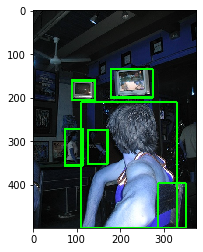

sheep JPEGImages/000062.jpg


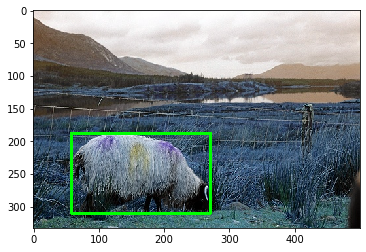

aeroplane JPEGImages/000067.jpg


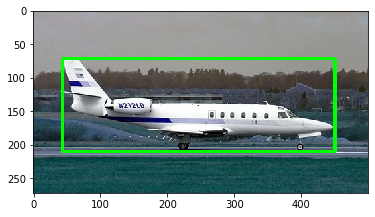

bird JPEGImages/000068.jpg


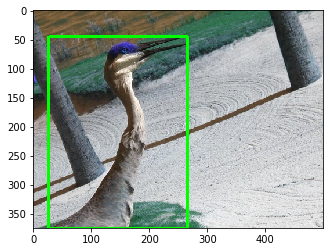

boat JPEGImages/000069.jpg
person JPEGImages/000069.jpg


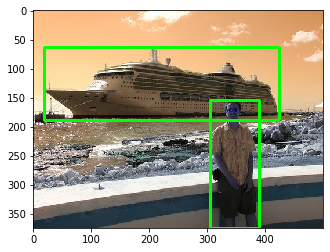

pottedplant JPEGImages/000070.jpg
pottedplant JPEGImages/000070.jpg


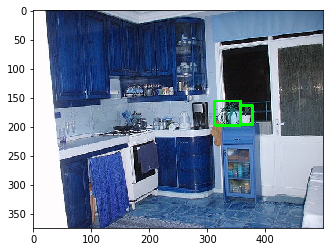

car JPEGImages/000071.jpg


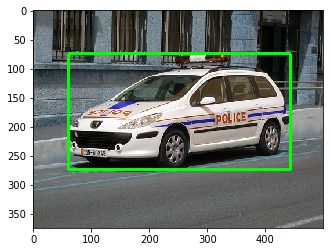

car JPEGImages/000074.jpg


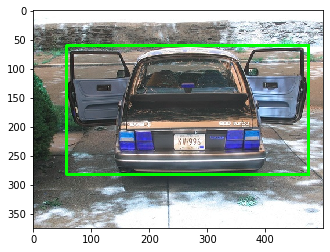

dog JPEGImages/000075.jpg


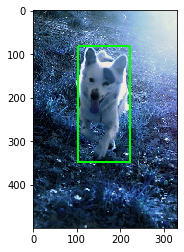

person JPEGImages/000076.jpg
person JPEGImages/000076.jpg
person JPEGImages/000076.jpg
person JPEGImages/000076.jpg
person JPEGImages/000076.jpg
person JPEGImages/000076.jpg
person JPEGImages/000076.jpg
person JPEGImages/000076.jpg
person JPEGImages/000076.jpg
person JPEGImages/000076.jpg
person JPEGImages/000076.jpg


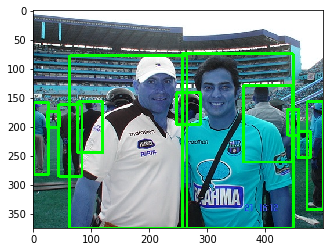

dog JPEGImages/000079.jpg


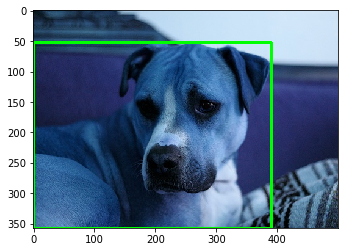

boat JPEGImages/000080.jpg
boat JPEGImages/000080.jpg
boat JPEGImages/000080.jpg
boat JPEGImages/000080.jpg
boat JPEGImages/000080.jpg
boat JPEGImages/000080.jpg
boat JPEGImages/000080.jpg
boat JPEGImages/000080.jpg
boat JPEGImages/000080.jpg


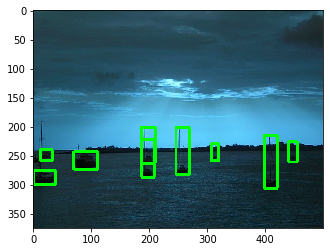

car JPEGImages/000082.jpg
car JPEGImages/000082.jpg


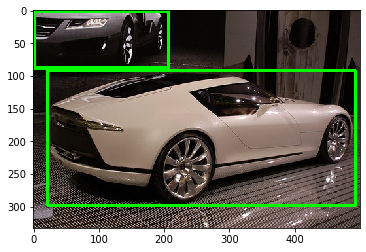

chair JPEGImages/000084.jpg
chair JPEGImages/000084.jpg
chair JPEGImages/000084.jpg
chair JPEGImages/000084.jpg
chair JPEGImages/000084.jpg
sofa JPEGImages/000084.jpg
diningtable JPEGImages/000084.jpg


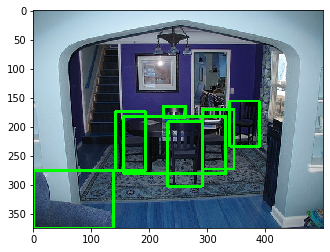

chair JPEGImages/000085.jpg
diningtable JPEGImages/000085.jpg
person JPEGImages/000085.jpg
person JPEGImages/000085.jpg


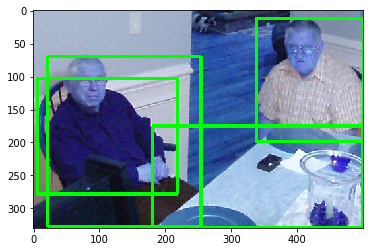

dog JPEGImages/000086.jpg
dog JPEGImages/000086.jpg
dog JPEGImages/000086.jpg


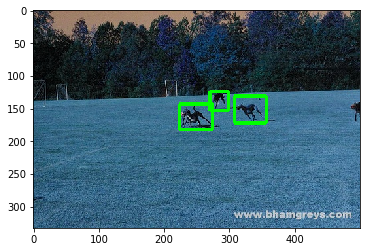

train JPEGImages/000087.jpg


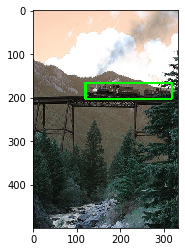

train JPEGImages/000088.jpg


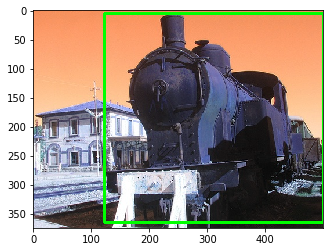

chair JPEGImages/000090.jpg
person JPEGImages/000090.jpg
person JPEGImages/000090.jpg


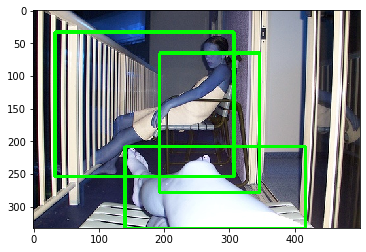

cat JPEGImages/000092.jpg


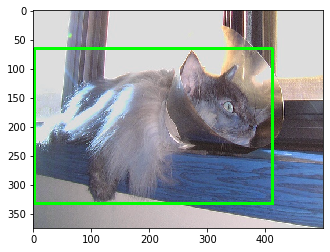

motorbike JPEGImages/000094.jpg
motorbike JPEGImages/000094.jpg


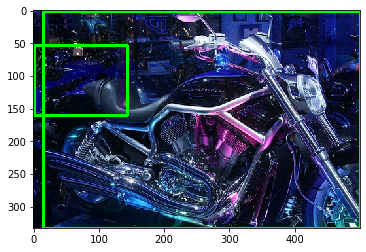

person JPEGImages/000096.jpg
person JPEGImages/000096.jpg


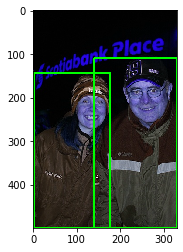

sofa JPEGImages/000097.jpg
chair JPEGImages/000097.jpg
person JPEGImages/000097.jpg


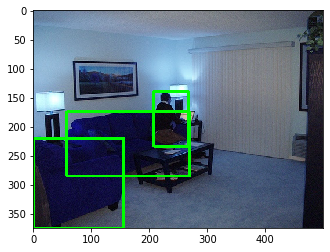

cat JPEGImages/000098.jpg


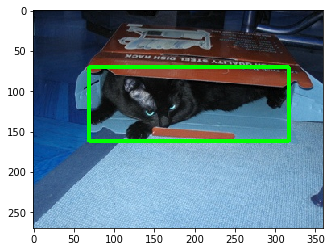

train JPEGImages/000100.jpg


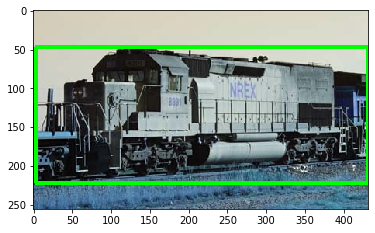

car JPEGImages/000103.jpg
car JPEGImages/000103.jpg
car JPEGImages/000103.jpg
car JPEGImages/000103.jpg
car JPEGImages/000103.jpg
car JPEGImages/000103.jpg
car JPEGImages/000103.jpg
car JPEGImages/000103.jpg
car JPEGImages/000103.jpg


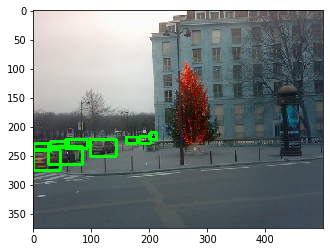

boat JPEGImages/000105.jpg
person JPEGImages/000105.jpg
person JPEGImages/000105.jpg


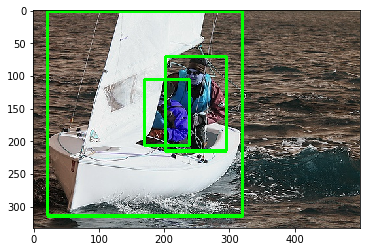

bird JPEGImages/000106.jpg


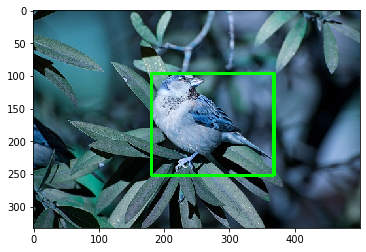

dog JPEGImages/000108.jpg
dog JPEGImages/000108.jpg
sofa JPEGImages/000108.jpg


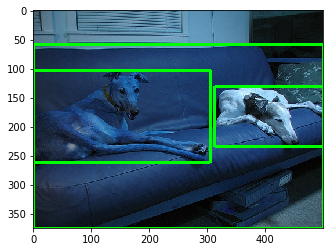

person JPEGImages/000111.jpg
person JPEGImages/000111.jpg
person JPEGImages/000111.jpg
person JPEGImages/000111.jpg
person JPEGImages/000111.jpg
person JPEGImages/000111.jpg
person JPEGImages/000111.jpg
person JPEGImages/000111.jpg
person JPEGImages/000111.jpg
person JPEGImages/000111.jpg
motorbike JPEGImages/000111.jpg
bicycle JPEGImages/000111.jpg
bicycle JPEGImages/000111.jpg
bicycle JPEGImages/000111.jpg
bicycle JPEGImages/000111.jpg
bicycle JPEGImages/000111.jpg
bicycle JPEGImages/000111.jpg
bicycle JPEGImages/000111.jpg
bicycle JPEGImages/000111.jpg
chair JPEGImages/000111.jpg


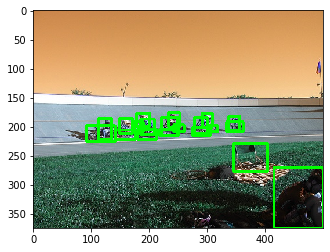

In [10]:
for i in range(30,60):
    image_h=(valid_data[i]['height'])
    image_w=(valid_data[i]['width'])
    img=cv2.imread(root+val_dir+valid_data[i]['filename'])
    for obj in valid_data[i]['object']:
        print(obj['name'],valid_data[i]['filename'])
        xmin,ymin,xmax,ymax=list(obj.values())[1:]
        cv2.rectangle(img, (int(xmin*image_w),int(ymin*image_h)), (int(xmax*image_w),int(ymax*image_h)), (0,255,0), 3)
    plt.imshow(img)
    plt.show()

data_check=True
if data_check==True:
    sampleX,sampleY=next(train_batch)
    plt.imshow(sampleX[3])
    plt.show()
    img=sampleY[3][...,3,11+5]
    plt.imshow(img)
    plt.show()
    for i in range(4,5):
        print('index',i)
        plt.imshow(sampleY[3][...,3,i]*10)
        plt.show()

### Train Block

In [11]:
model=build_model()
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 416, 416, 3)  0                                            
__________________________________________________________________________________________________
conv_1 (Conv2D)                 (None, 416, 416, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
norm_1 (BatchNormalization)     (None, 416, 416, 32) 128         conv_1[0][0]                     
__________________________________________________________________________________________________
leaky_re_lu (LeakyReLU)         (None, 416, 416, 32) 0           norm_1[0][0]                     
__________________________________________________________________________________________________
max_poolin

In [12]:
for layer in model.layers[-31:]:
        print(layer)

In [13]:


def train_model(model):
  #filepath="D:/"+exp_name+"weights-improvement-{epoch:02d}-{val_loss:.2f}.hdf5"
  filepath=root+exp_name+"best.hdf5"
  checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
  callbacks_list = [checkpoint]
  model.compile(loss=yolo_loss_1, optimizer=optimizer,metrics=['accuracy'])
  if anc_box==True:
    model.compile(loss=yolo_loss_1, optimizer=optimizer,metrics=['accuracy'])
  history=model.fit_generator(train_batch,
                              steps_per_epoch=no_of_tr_batch,
                              epochs=epochs,
                              callbacks=callbacks_list,
                              validation_data=valid_batch,
                              validation_steps=no_of_val_batch)

  
  return model,history


Epoch 1/20
500/501 [============================>.] - ETA: 0s - loss: 77.2697 - acc: 0.0720
Epoch 00001: val_loss improved from inf to 38.99238, saving model to D:/v-2.1.416.ANC/best.hdf5
501/501 [==============================] - 228s 456ms/step - loss: 77.1924 - acc: 0.0721 - val_loss: 38.9924 - val_acc: 0.1305
Epoch 2/20
500/501 [============================>.] - ETA: 0s - loss: 27.4757 - acc: 0.1515
Epoch 00002: val_loss improved from 38.99238 to 25.15598, saving model to D:/v-2.1.416.ANC/best.hdf5
501/501 [==============================] - 222s 443ms/step - loss: 27.4774 - acc: 0.1515 - val_loss: 25.1560 - val_acc: 0.1693
Epoch 3/20
500/501 [============================>.] - ETA: 0s - loss: 22.6569 - acc: 0.1711
Epoch 00003: val_loss improved from 25.15598 to 22.35078, saving model to D:/v-2.1.416.ANC/best.hdf5
501/501 [==============================] - 223s 446ms/step - loss: 22.6602 - acc: 0.1711 - val_loss: 22.3508 - val_acc: 0.1720
Epoch 4/20
500/501 [=========================

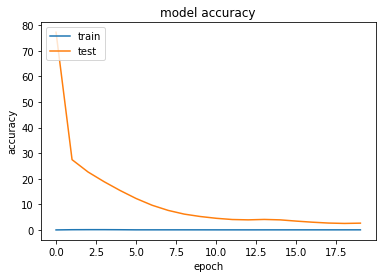

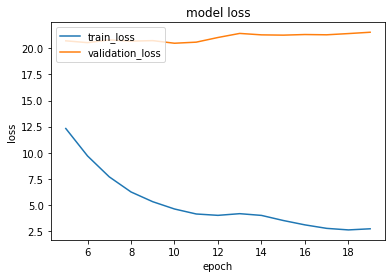

10 20.494745456811152


In [14]:
from __future__ import print_function
if train==True:
    model=load_weights(model,path_wts)
    #for layer in model.layers[:-31]:
    #    layer.trainable=False
    model,history=train_model(model)
    
    
    plt.plot(history.history['acc'])
    plt.plot(history.history['loss'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()
    
    # summarize history for loss
    plt.plot(range(5,epochs),history.history['loss'][5:])
    plt.plot(range(5,epochs),history.history['val_loss'][5:])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train_loss', 'validation_loss'], loc='upper left')
    plt.savefig(root+exp_name+'yolo-v1_exp.png')
    plt.show()
    

    f=open(root+exp_name+'history:_ep_70_v-1.0_exp','wb')
    pickle.dump([history.history['loss'],history.history['val_loss']],f)
    f.close()
    val_loss=np.array(history.history['val_loss'])
    best_epoch=np.argmin(val_loss) 
    print(best_epoch,val_loss[best_epoch])
if test_mode==1:
    model.load_weights(path_wts_final)
if test_mode==2:
    model=load_weights(model,path_wts)

### Predicion Block

In [15]:
def _softmax(x, axis=-1, t=-100.):
    x = x - np.max(x)
    
    if np.min(x) < t:
        x = x/np.min(x)*t
        
    e_x = np.exp(x)
    
    return e_x / e_x.sum(axis, keepdims=True)

def _sigmoid(x):
    return 1. / (1. + np.exp(-x))

def nmax_supp(boxes):
    df=pd.DataFrame(boxes,columns=['x','y','w','h','conf','_class'])
    sdf=df.sort_values('conf',ascending=False).reset_index(drop=True)
    #print(sdf)
    for ind1 in range(len(sdf)-1):
        box1=sdf.loc[ind1,['x','y','w','h']].values
        b1_class=sdf.loc[ind1,['_class']].values
        for ind2 in range(ind1+1,len(sdf)):
            b2_class=sdf.loc[ind2,['_class']].values
            b2_conf=sdf.loc[ind2,['conf']].values
            if b2_class==b1_class and b2_conf>0.0:
                 box2=sdf.loc[ind2,['x','y','w','h']].values
                 if b1_class==b2_class and IOU(box1,box2)>=0.1:
                    sdf.loc[ind2,'conf']=0.0
    ndf=sdf[sdf.conf>0.0]
    return list(ndf.values)#[:len(ndf.values)//2]

def decode_netout_anc(netout, anchors, nb_class, obj_threshold=0.3, nms_threshold=0.3):
    #grid_h, grid_w, nb_box = netout.shape[:3]
    grid_h, grid_w = netout.shape[:2]
    
    boxes = []
    # decode the output by the network
    netout[..., 4]  = _sigmoid(netout[..., 4])
    netout[..., 5:] = netout[..., 4][..., np.newaxis] * _softmax(netout[..., 5:])
    netout[..., 5:] *= netout[..., 5:] > obj_threshold

    for row in range(grid_h):
        for col in range(grid_w):
            for b in range(BOX):
                # from 4th element onwards are confidence and class classes
                classes = netout[row,col,b,5:]
                #classes = netout[row,col,5:]
                confidence = netout[row,col,b,4]
                if np.sum(classes) > 0:
                    x, y, w, h = netout[row,col,b,:4]
                    x = (col + _sigmoid(x)) / grid_w # center position, unit: image width
                    y = (row + _sigmoid(y)) / grid_h # center position, unit: image height
                    w = ANCHORS[2 * b + 0] * np.exp(w) / grid_w # unit: image width
                    h = ANCHORS[2 * b + 1] * np.exp(h) / grid_h # unit: image height
                    #print(x,y,w,h)
                    classes=np.argmax(classes)
                    
                    box = (x-w/2, y-h/2, x+w/2, y+h/2, confidence, classes)
                    box = (x-w/2, y-h/2, x+w/2, y+h/2, confidence, classes)
                    boxes.append(box)   
    f_boxes=nmax_supp(boxes)
    return f_boxes    

def decode_netout_1(netout, anchors, nb_class, obj_threshold=0.3, nms_threshold=0.3):
    #grid_h, grid_w, nb_box = netout.shape[:3]
    grid_h, grid_w = netout.shape[:2]
    boxes = []
    
    # decode the output by the network
    netout[..., 4]  = _sigmoid(netout[..., 4])
    netout[..., 5:] = netout[..., 4][..., np.newaxis] * _softmax(netout[..., 5:])
    netout[..., 5:] *= netout[..., 5:] > obj_threshold
    class_prob_log=[0]*CLASS
    #boxes=[(0,)*6]*CLASS
    boxes=[]
    for row in range(grid_h):
        for col in range(grid_w):
            #for b in range(BOX):
                # from 4th element onwards are confidence and class classes
                classes = netout[row,col,5:]
                #classes = netout[row,col,5:]
                confidence = _sigmoid(netout[row,col,4])
                if np.sum(classes) > 0:
                    # first 4 elements are x, y, w, and h
                    #x, y, w, h = netout[row,col,b,:4]
                    x, y, w, h = netout[row,col,:4]
                    #print(col,_sigmoid(x-col),row,_sigmoid(y),w,h)
                    w_ratio=(IMAGE_W/GRID_W)/IMAGE_W
                    h_ratio=(IMAGE_W/GRID_W)/IMAGE_H
                    x = (col+_sigmoid(x))*(h_ratio)#x*(32/416) # center position, unit: image width
                    y = (row+_sigmoid(y))*(w_ratio)#y*(32/416) # center position, unit: image height
                    w = w*(w_ratio) # unit: image width
                    h = h*(h_ratio) # unit: image height
                    #print(x,y,w,h)
                    class_ind=np.argmax(classes)
                    #if class_prob_log[class_ind]< classes[class_ind]:       
                    class_prob_log[class_ind]=classes[class_ind]
                    box = (x-w/2, y-h/2, x+w/2, y+h/2, confidence, class_ind)
                    #if abs(box[0])<=1 and abs(box[1])<=1 and box[2]<=1 and box[3]<=1 :
                    #    if (box[0])>=0 and (box[1])>=0 and box[2]>=0 and box[3]>=0 :
                    boxes.append(box)
                                       #boxes[class_ind]=box

                      
    
    f_boxes=nmax_supp(boxes)
    return f_boxes#[:5]   

def draw_boxes_1(image, boxes, labels,t_lbl=None):
    image_h, image_w, _ = image.shape
    wf=image_w/IMAGE_W
    hf=image_h/IMAGE_H
    show_gt=False
    if show_gt==True:
        for box in t_lbl:
            box=list(box.values())
            xmin = int(box[1]*wf)
            ymin = int(box[2]*hf)
            xmax = int(box[3]*wf)
            ymax = int(box[4]*hf)

            cv2.rectangle(image, (xmin,ymin), (xmax,ymax), (255,0,0), 3)
            cv2.putText(image, 
                        box[0] + ' ', 
                        (xmin, ymin - 13), 
                        cv2.FONT_HERSHEY_SIMPLEX, 
                        0.0015 * 400, 
                        (255,0,0), 2)
    for box in boxes:
        xmin = int(box[0]*image_w)
        ymin = int(box[1]*image_h)
        xmax = int(box[2]*image_w)
        ymax = int(box[3]*image_h)
        cv2.rectangle(image, (xmin,ymin), (xmax,ymax), (0,255,0), 3)
        cv2.putText(image, 
                    labels[int(box[5])] + ' ' + str(box[4]), 
                    (xmin, ymin - 13), 
                    cv2.FONT_HERSHEY_SIMPLEX, 
                    0.0015 * 400, 
                    (0,255,0), 2)
        
    return image




In [16]:
import json
import pickle
test_on_val =False
test_on_test=True
test_server=False
calc_map=True


  0%|                                                                                 | 2/4952 [00:00<04:41, 17.59it/s]

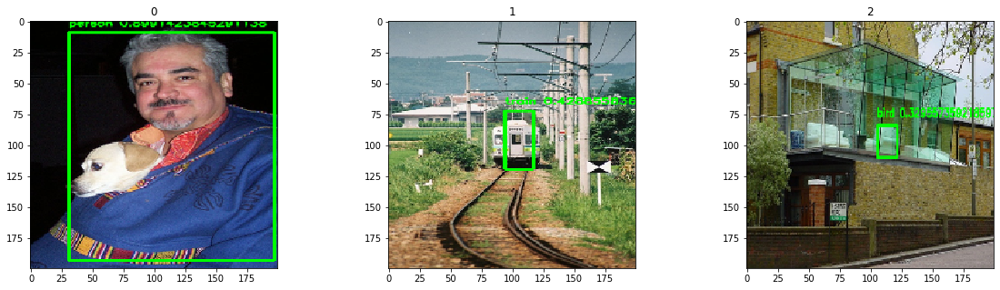


  0%|                                                                                 | 4/4952 [00:00<14:15,  5.79it/s]

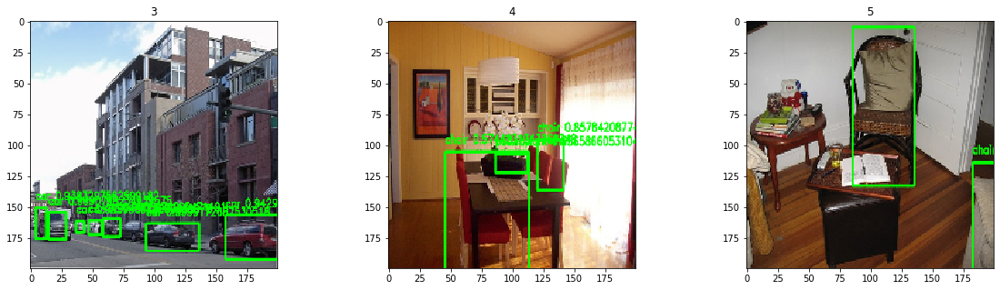


  0%|▏                                                                                | 8/4952 [00:01<12:24,  6.64it/s]

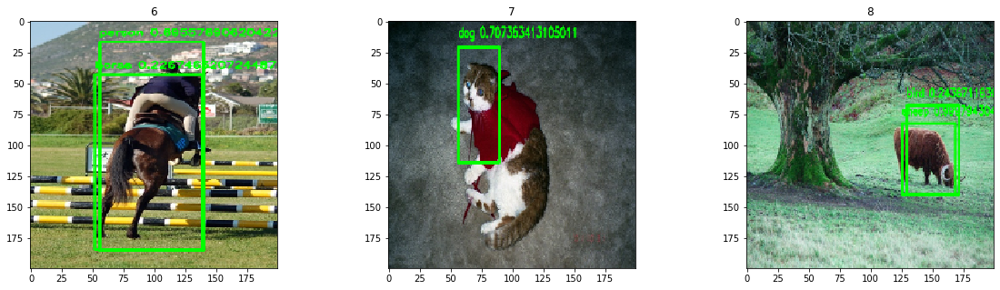


  0%|▏                                                                               | 10/4952 [00:01<14:55,  5.52it/s]

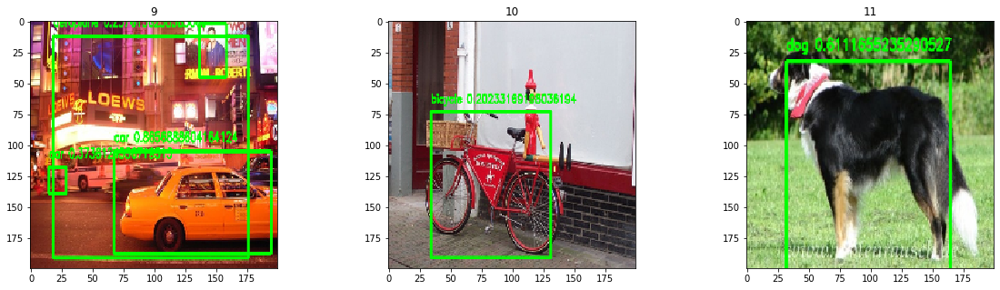


  0%|▏                                                                               | 14/4952 [00:02<13:22,  6.15it/s]

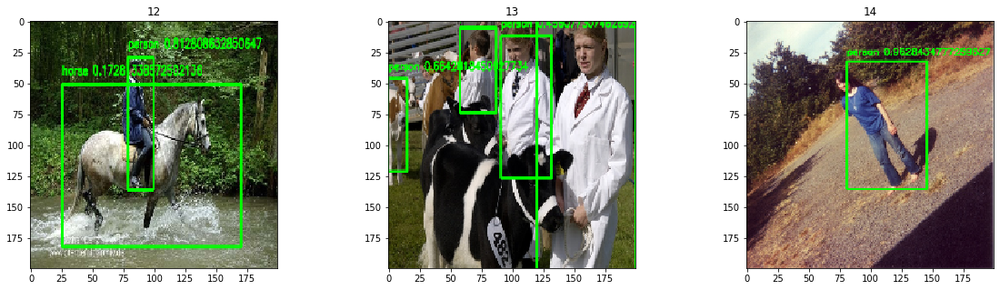


  0%|▎                                                                               | 17/4952 [00:02<14:15,  5.77it/s]

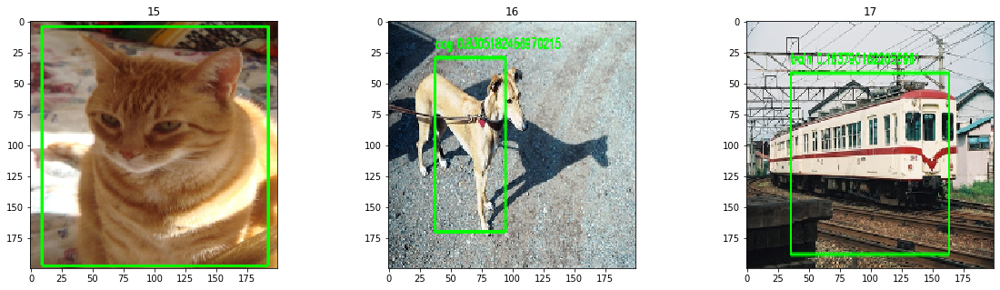


  0%|▎                                                                               | 20/4952 [00:03<14:44,  5.57it/s]

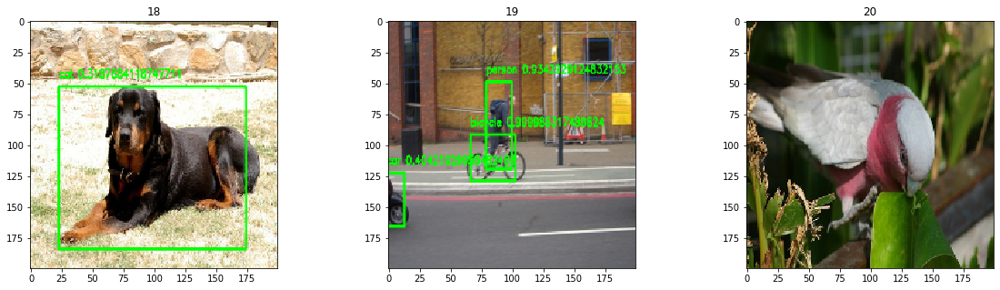


  0%|▎                                                                               | 22/4952 [00:03<15:53,  5.17it/s]

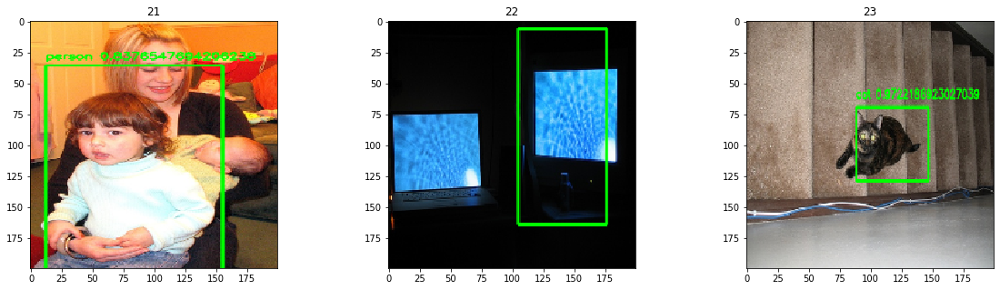


  1%|▍                                                                               | 26/4952 [00:04<12:57,  6.33it/s]

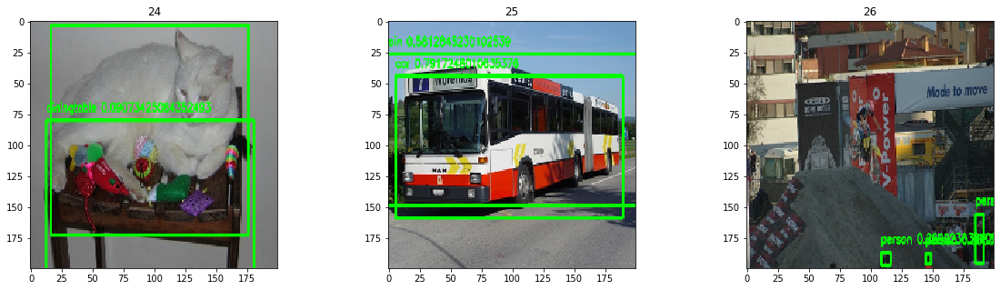


  1%|▍                                                                               | 28/4952 [00:04<14:33,  5.64it/s]

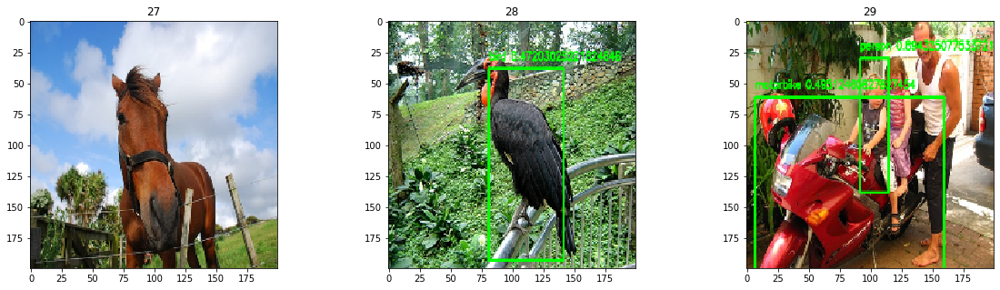


  1%|▌                                                                               | 32/4952 [00:05<12:44,  6.44it/s]

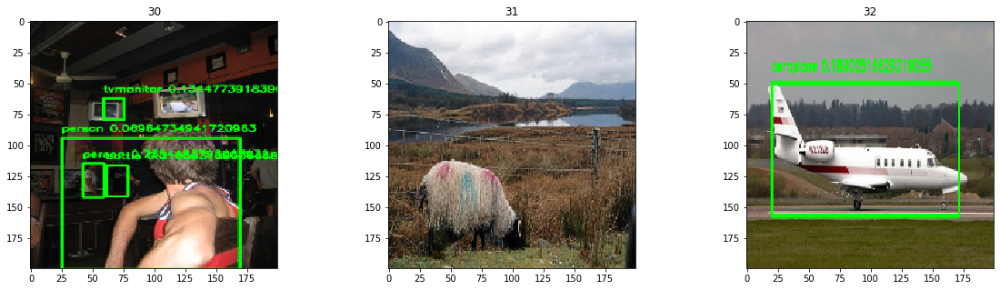


  1%|▌                                                                               | 35/4952 [00:05<14:03,  5.83it/s]

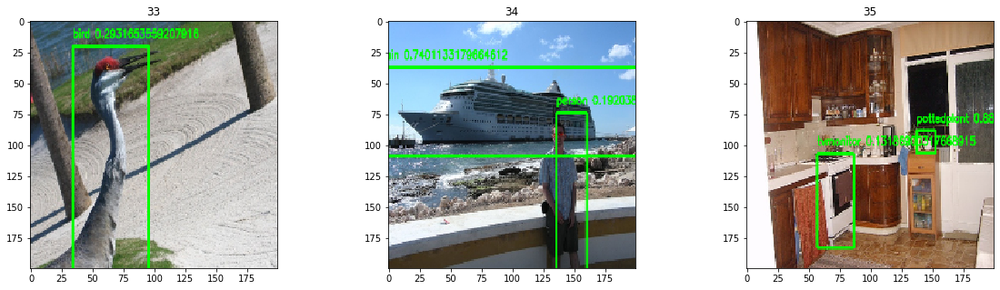


  1%|▌                                                                               | 37/4952 [00:06<15:13,  5.38it/s]

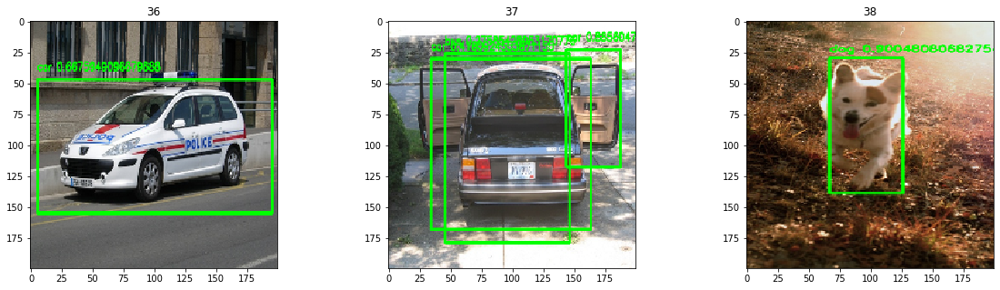


  1%|▋                                                                               | 40/4952 [00:06<17:14,  4.75it/s]

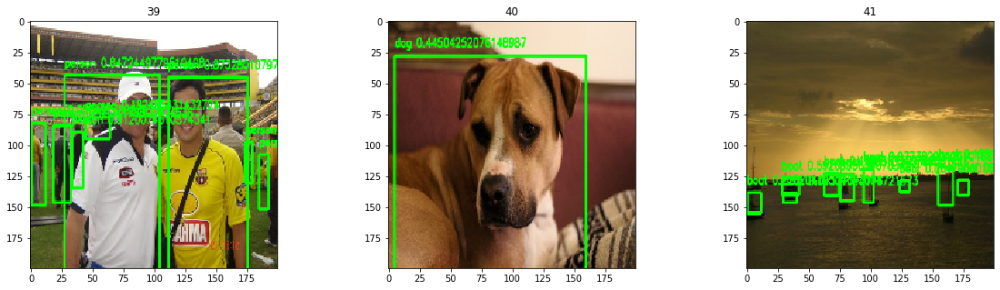


  1%|▋                                                                               | 44/4952 [00:07<15:43,  5.20it/s]

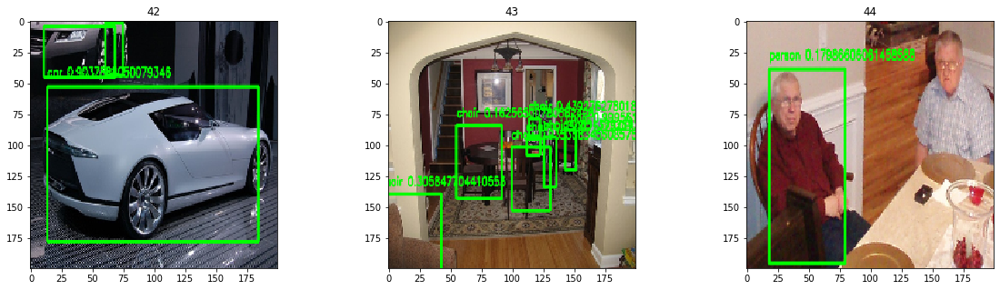


  1%|▊                                                                               | 47/4952 [00:08<15:35,  5.24it/s]

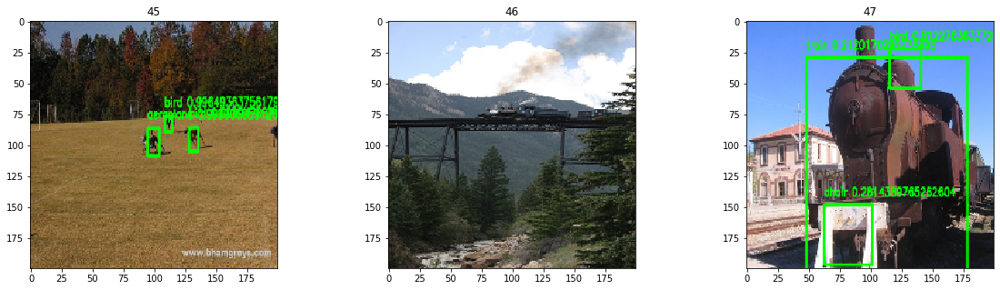


  1%|▊                                                                               | 50/4952 [00:08<15:24,  5.30it/s]

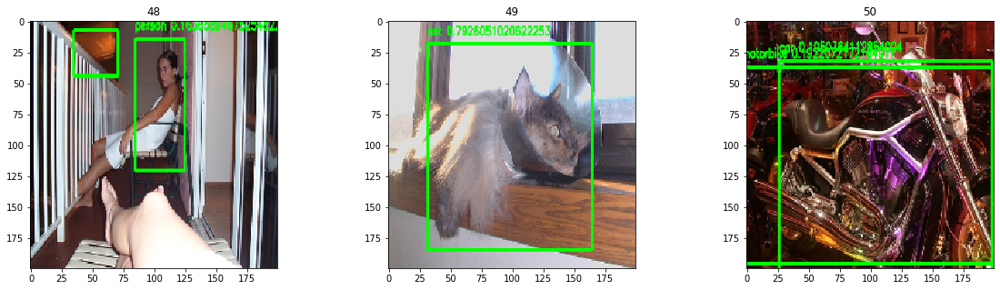


  1%|▊                                                                               | 52/4952 [00:09<16:18,  5.01it/s]

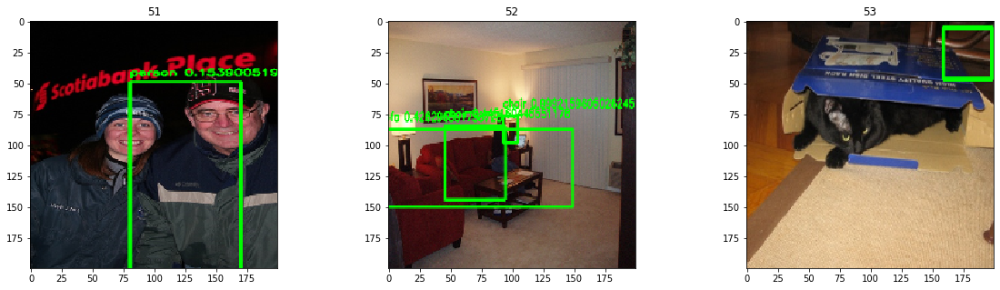


  1%|▉                                                                               | 56/4952 [00:09<14:09,  5.76it/s]

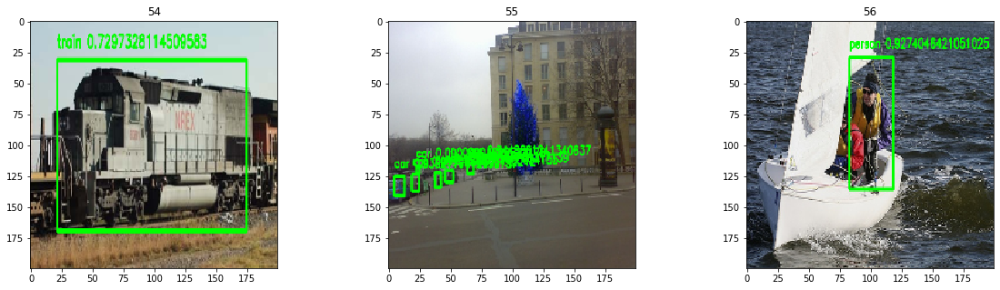


  1%|▉                                                                               | 59/4952 [00:10<14:42,  5.54it/s]

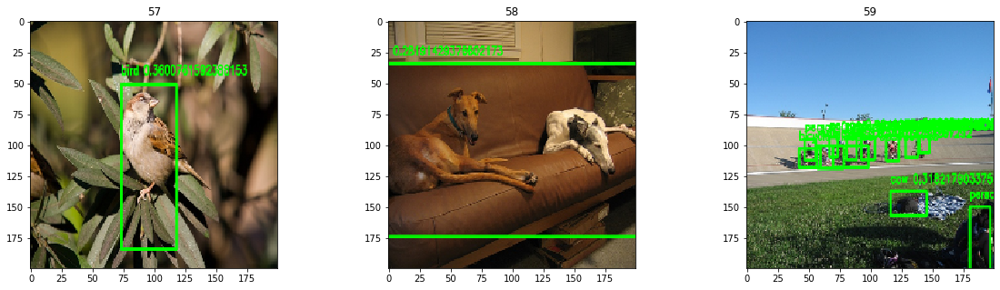


  1%|▉                                                                               | 61/4952 [00:10<17:00,  4.79it/s]

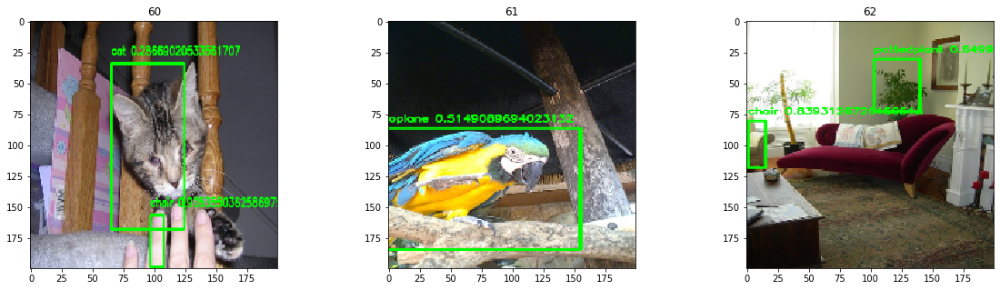


  6%|████▉                                                                          | 309/4952 [00:50<03:32, 21.83it/s]

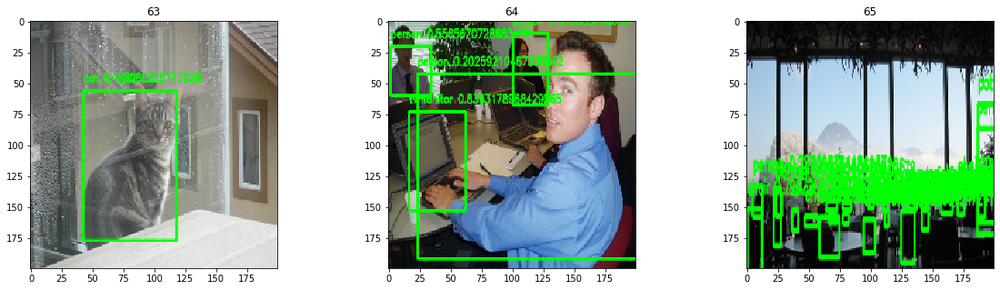


  1%|█                                                                               | 67/4952 [00:13<30:10,  2.70it/s]

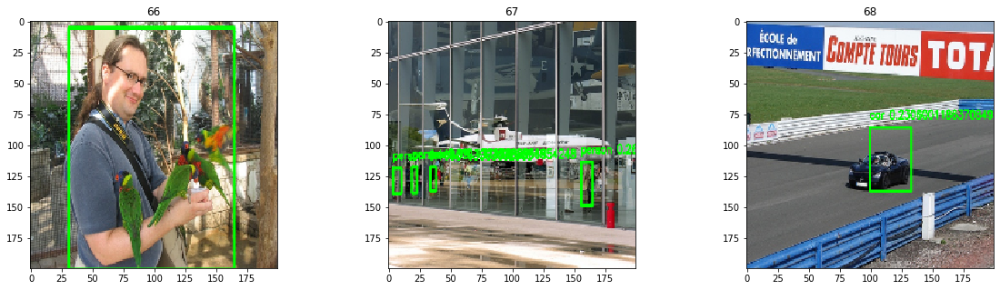


  1%|█▏                                                                              | 71/4952 [00:13<20:10,  4.03it/s]

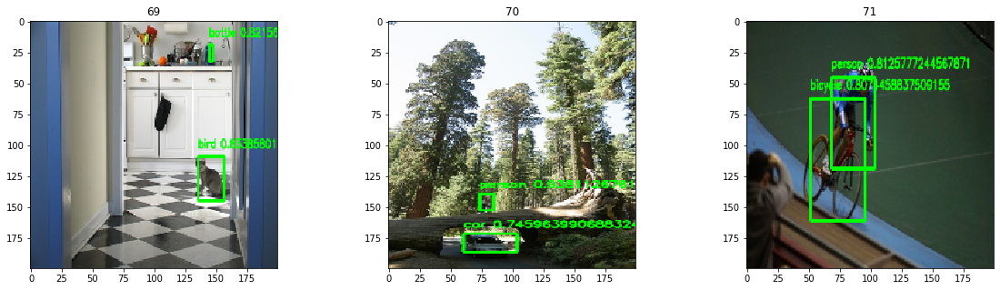


  1%|█▏                                                                              | 73/4952 [00:14<21:59,  3.70it/s]

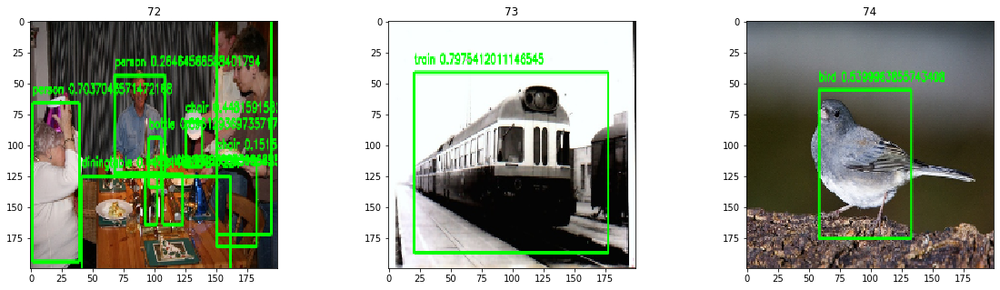


  2%|█▏                                                                              | 77/4952 [00:14<17:07,  4.74it/s]

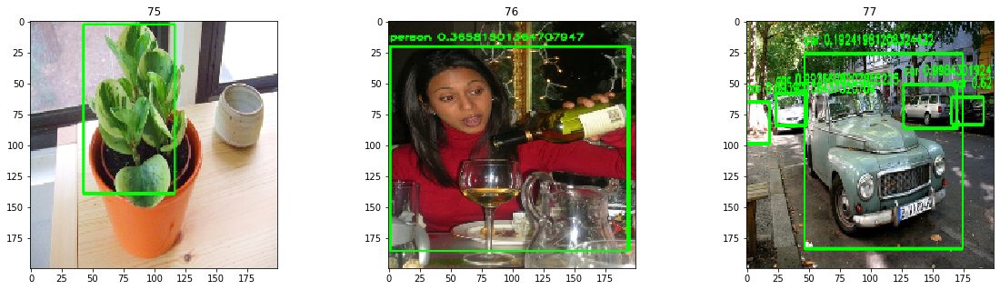


  2%|█▎                                                                              | 80/4952 [00:15<17:11,  4.72it/s]

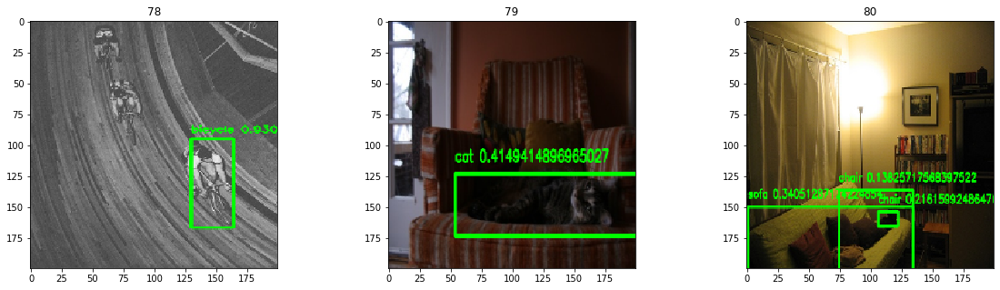


  2%|█▎                                                                              | 82/4952 [00:16<18:49,  4.31it/s]

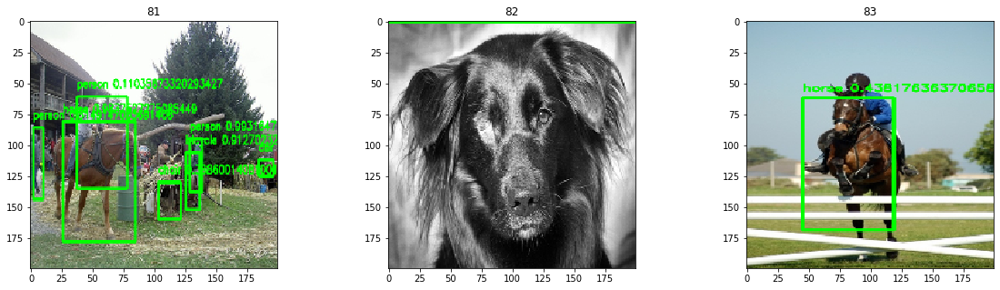


  2%|█▍                                                                              | 86/4952 [00:16<14:21,  5.65it/s]

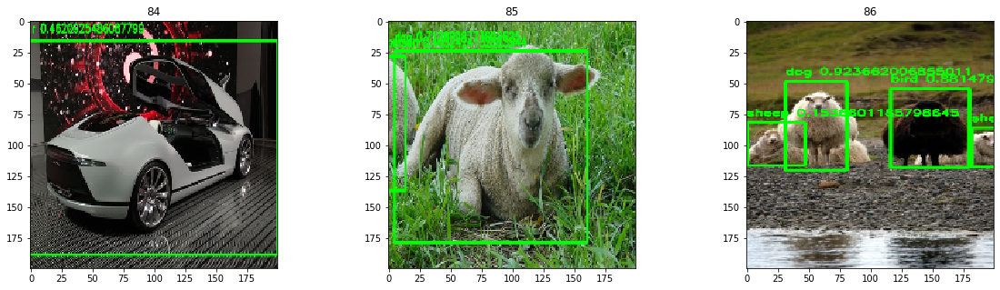


  2%|█▍                                                                              | 88/4952 [00:17<19:01,  4.26it/s]

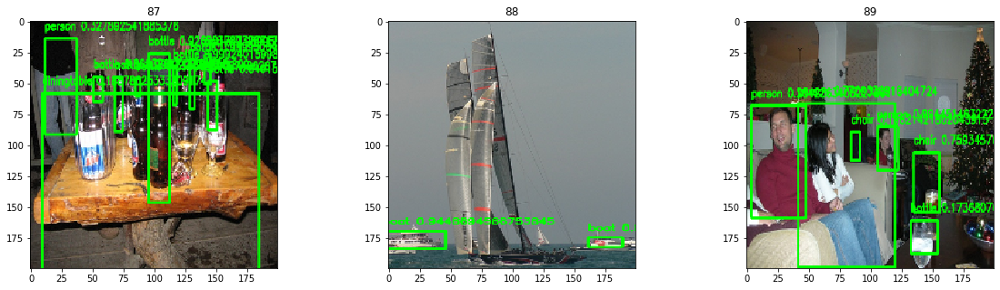


  2%|█▍                                                                              | 92/4952 [00:18<15:03,  5.38it/s]

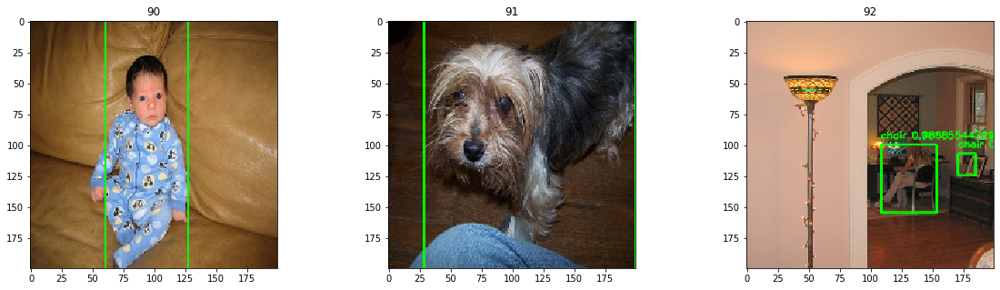


  2%|█▌                                                                              | 95/4952 [00:18<16:06,  5.02it/s]

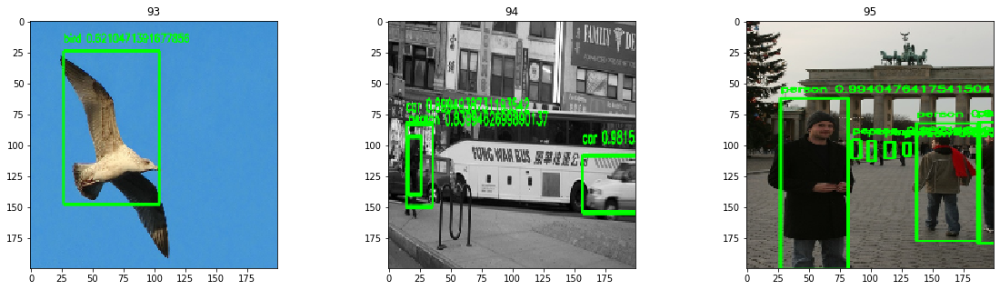


  2%|█▌                                                                              | 98/4952 [00:19<19:10,  4.22it/s]

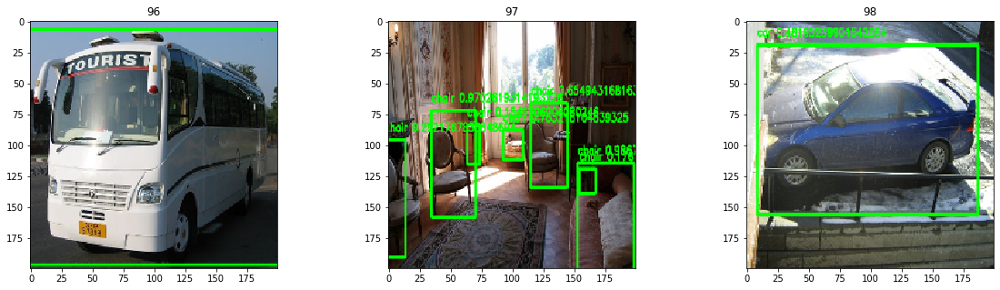


  5%|████▏                                                                          | 264/4952 [00:31<07:14, 10.80it/s]


  9%|██████▊                                                                        | 429/4952 [00:42<03:56, 19.15it/s]


 12%|█████████▋                                                                     | 606/4952 [00:53<06:26, 11.23it/s]


 16%|████████████▎                                                                  | 772/4952 [01:06<05:04, 13.72it/s]


 19%|███████████████▏                                                               | 952/4952 [01:16<03:19, 20.10it/s]


 23%|█████████████████▊                                                            | 1131/4952 [01:27<04:15, 14.93it/s]


 26%|████████████████████▎                                                         | 1290/4952 [01:38<05:31, 11.06it/s]


 29%|██████████████████████▉                                                       | 1453/4952 [01:50<03:36, 16.15it/s]


 33%|█████████████████████████▋                                                    | 1632/4952 [02:02<03:42, 14.90it/s]


 36%|████████████████████████████▏                                                 | 1791/4952 [02:14<04:40, 11.28it/s]


 39%|██████████████████████████████▊                                               | 1954/4952 [02:26<02:38, 18.89it/s]


 43%|█████████████████████████████████▌                                            | 2127/4952 [02:37<03:14, 14.54it/s]


 46%|████████████████████████████████████▏                                         | 2298/4952 [02:48<02:44, 16.12it/s]


 50%|██████████████████████████████████████▊                                       | 2468/4952 [02:59<02:23, 17.26it/s]


 53%|█████████████████████████████████████████▍                                    | 2634/4952 [03:10<02:32, 15.23it/s]


 56%|███████████████████████████████████████████▉                                  | 2790/4952 [03:20<03:00, 11.97it/s]


 59%|██████████████████████████████████████████████▍                               | 2946/4952 [03:33<03:07, 10.68it/s]


 63%|████████████████████████████████████████████████▉                             | 3107/4952 [03:44<01:54, 16.08it/s]


 66%|███████████████████████████████████████████████████▍                          | 3269/4952 [04:00<02:51,  9.84it/s]


 70%|██████████████████████████████████████████████████████▏                       | 3444/4952 [04:11<02:19, 10.79it/s]


 73%|█████████████████████████████████████████████████████████                     | 3623/4952 [04:21<01:04, 20.54it/s]


 76%|███████████████████████████████████████████████████████████▋                  | 3788/4952 [04:32<01:22, 14.06it/s]


 80%|██████████████████████████████████████████████████████████████▏               | 3949/4952 [04:44<01:10, 14.18it/s]


 83%|████████████████████████████████████████████████████████████████▊             | 4115/4952 [04:56<00:49, 16.80it/s]


 86%|███████████████████████████████████████████████████████████████████▍          | 4278/4952 [05:08<01:05, 10.32it/s]


 90%|██████████████████████████████████████████████████████████████████████▏       | 4453/4952 [05:20<00:56,  8.79it/s]


 93%|████████████████████████████████████████████████████████████████████████▌     | 4610/4952 [05:30<00:21, 15.84it/s]


 96%|███████████████████████████████████████████████████████████████████████████   | 4766/4952 [05:43<00:13, 13.96it/s]


 99%|█████████████████████████████████████████████████████████████████████████████▍| 4917/4952 [05:54<00:02, 13.84it/s]


100%|██████████████████████████████████████████████████████████████████████████████| 4952/4952 [05:57<00:00, 13.87it/s]


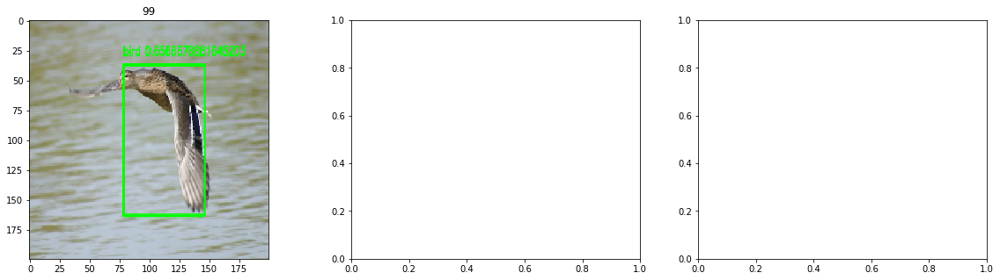

In [38]:
error=0
count=0
import pandas as pd
from copy import copy, deepcopy
from tqdm import tqdm,trange
result_df=pd.DataFrame({},columns=['class','iou','correct','True','img','boxx1','boxy1','boxx2','boxy2','conf'])
ind_loc=0
total_true_per_class={}
for _class in LABELS:
        total_true_per_class[_class]=0

if not os.path.exists('input/ground-truth'):
    os.mkdir('input/ground-truth')
if not os.path.exists('input/detection-results'):
    os.mkdir('input/detection-results')

pred_dicts=[]
for i in trange(0,len(test_data)):
  count+=1
  if test_on_test==True:
     sample=test_data[i]
     image = cv2.imread(root+test_dir+sample['filename'])
  if test_on_val==True:
     sample=valid_data[i]
     image = cv2.imread(root+val_dir+sample['filename'])
  image_h,image_w,_=image.shape
  input_image = cv2.resize(image, (IMAGE_W, IMAGE_H))
  input_image = input_image / 255.
  input_image = np.expand_dims(input_image, 0)
  netout = model.predict(input_image)
  
  if anc_box==True:
    pred_labels = decode_netout_anc(netout[0], 
                        obj_threshold=0.05,
                        nms_threshold=.90,
                        anchors=ANCHORS, 
                        nb_class=CLASS)
  
  if anc_box==False:
    pred_labels = decode_netout_1(netout[0], 
                        obj_threshold=0.05,
                        nms_threshold=.90,
                        anchors=ANCHORS, 
                        nb_class=CLASS)
    
  if test_server==True:
  
      for pred_box in pred_labels:
          _x= pred_box[0]
          _y= pred_box[1]
          _width=(pred_box[2]-_x)
          _height=(pred_box[3]-_y)
          _class=list(_LABELS.keys())[int(pred_box[5])]
          pred={ 
              "image_id": int(sample['id']), 
              "category_id": int(_class), 
              "bbox": [round(_x*image_w,2),round(_y*image_h,2),round(_width*image_w,2),round(_height*image_h,2)], 
              "score": float(pred_box[4]),
          }
          true_labels=None
          pred_dicts.append(pred)
      
  if calc_map==True: 
      true_labels=sample['object']
    
      true_lb={}
      pred_lb={}
      for lbl in LABELS:
           true_lb[lbl]=[]
           pred_lb[lbl]=[]
      f=open('input/ground-truth/'+str(i)+'.txt','w')
      str_true=''
      for lbl in true_labels:
              [name,xmin,ymin,xmax,ymax]=list(lbl.values())
              true_lb[name].append([(xmin),(ymin), (xmax),(ymax)])#[cx,cy,iw,ih]
              try:name=name.split(' ')[0]+'-'+name.split(' ')[1]
              except:0
              str_true+=str(name)+' '+str(xmin)+' '+str(ymin)+' '+str(xmax)+' '+str(ymax)+'\n'
      f.write(str_true)
      f.close()

      f=open('input/detection-results/'+str(i)+'.txt','w')
      str_pred=''
      for box in pred_labels: 
              [xmin,ymin,xmax,ymax,conf,_name]=box
              name=LABELS[int(_name)]
              pred_lb[name].append([(xmin),(ymin), (xmax),(ymax),conf])#[cx,cy,iw,ih]
              try:name=name.split(' ')[0]+'-'+name.split(' ')[1]
              except:0
              str_pred+=str(name)+' '+str(conf)+' '+str(xmin)+' '+str(ymin)+' '+str(xmax)+' '+str(ymax)+'\n'
      f.write(str_pred)
      f.close()
           

      for _class in LABELS:
                for true_box in true_lb[_class]:
                    total_true_per_class[_class]+=1
                for pred_box in pred_lb[_class]:
                    _max_iou=0
                    for _ind,true_box in enumerate(true_lb[_class]):
                        _iou= IOU(true_box,pred_box[:4])
                        if _iou>=_max_iou:
                                _max_iou=_iou

                    result_df.loc[ind_loc,['class','iou','True','img','boxx1','boxy1','boxx2','boxy2','conf']]=[_class,_max_iou,1.0,i,pred_box[0],pred_box[1],pred_box[2],pred_box[3],pred_box[4]]
                    if _max_iou>=0.5:
                            result_df.loc[ind_loc,'correct']=1
                    else :
                            result_df.loc[ind_loc,'correct']=0
                    ind_loc+=1
            
       
  image = draw_boxes_1(image, pred_labels, LABELS,true_labels)
  
  if i<100:
      _image=cv2.resize(image,(200,200))
      if i%3==0 :fig,axes=plt.subplots(nrows=1,ncols=3,figsize=(20,5))  
      axes[i%3].imshow(_image[:,:,::-1])
      axes[i%3].set_title(str(i))#+','+str(_ious))
      if i%3==3-1 :plt.show()
  

In [39]:
#result_df#.loc[:50]

In [40]:
len(pred_dicts)

0

In [41]:
f=open('test2017_detections_yolo_results.json','w')
json.dump(pred_dicts,f)
f.close()

In [42]:
!python map.py

40.95% = aeroplane AP 
43.78% = bicycle AP 
33.50% = bird AP 
30.54% = boat AP 
36.03% = bottle AP 
19.95% = bus AP 
58.99% = car AP 
34.09% = cat AP 
42.02% = chair AP 
34.36% = cow AP 
23.63% = diningtable AP 
17.81% = dog AP 
41.05% = horse AP 
38.14% = motorbike AP 
58.45% = person AP 
26.95% = pottedplant AP 
18.63% = sheep AP 
28.66% = sofa AP 
47.80% = train AP 
36.02% = tvmonitor AP 
mAP = 35.57%
Figure(640x480)


In [43]:
def get_average_precision(res_class,_class):
    total_true=total_true_per_class[_class]
    #total_true=counts[_class]
    res_class['precision']=0
    res_class['recall']=0
    right=0
    for i in range(len(res_class)):
        if res_class.loc[i,'correct']==1 : right+=1
        res_class.loc[i,'precision']=right/(i+1)
        res_class.loc[i,'recall']=right/total_true
        
    AP=0
    res_class['auc']=res_class.precision.diff()
    indexes=res_class[res_class['auc']< 0.0].index.values-1
    res_class['new']=res_class.recall.diff()
    res_class['new']=res_class['new']*res_class.precision
    
    for i,ind in enumerate(indexes[:-1]):
        _precision=res_class.loc[indexes[i+1],'precision']
        delta_recall=abs(res_class.loc[indexes[i+1],'recall']-res_class.loc[indexes[i],'recall'])
        AP+=_precision*delta_recall
    return (AP),res_class


In [44]:
counts=result_df['class'].value_counts()
res_grp=result_df.groupby('class')
mAP=0
log_dfs={}
APS={}
for label in LABELS:
  try:
    res_class=res_grp.get_group(label).reset_index(drop=True)
    res_class=res_class.sort_values(by='conf',ascending=False).reset_index(drop=True)
    AP,log_df=get_average_precision(res_class,label)
    mAP+=AP*counts[label]
    print(label,AP,counts[label])
    log_dfs[label]=log_df
    APS[label]=AP
  except:0
mAP=mAP/counts.sum()
APS['mAP']=mAP
print('mAP:',mAP)

person 0.25525325800766835 4099
bird 0.10762340430228325 497
cat 0.2677217268406475 409
cow 0.13797645714535053 241
dog 0.11616431019547152 311
horse 0.3469570836179514 204
sheep 0.07808429101072373 161
aeroplane 0.13087553129099208 261
bicycle 0.24259647389242875 270
boat 0.014240525701871369 444
bus 0.10915375342558477 89
car 0.23657784628845535 1873
motorbike 0.2954805468891485 230
train 0.2813752500728696 252
bottle 0.042169821680188666 724
chair 0.09350929840769334 1752
diningtable 0.1494176592641141 180
pottedplant 0.048659361752654534 549
sofa 0.21260759447724875 302
tvmonitor 0.18949296074317706 317
mAP: 0.18472616569638123


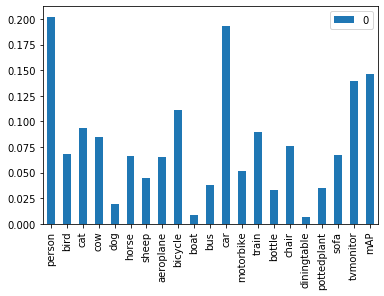

In [24]:
import pickle
f=open(root+exp_name+'mAP','wb')
pickle.dump(APS,f)
f.close()
AP_df=pd.DataFrame(APS,index=[0]).transpose()
AP_df.plot.bar()

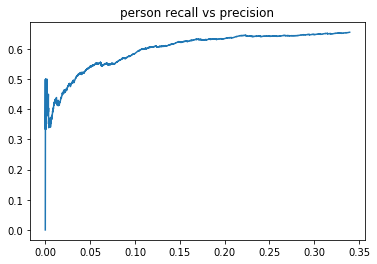

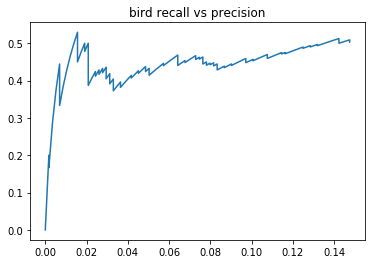

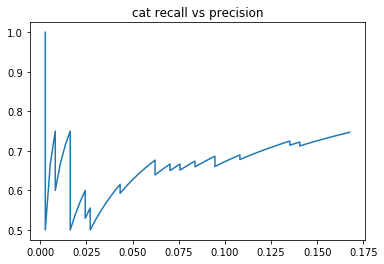

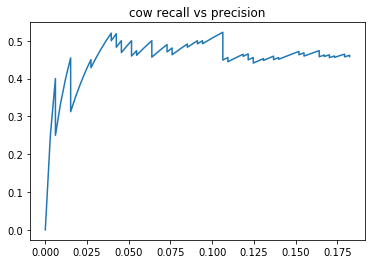

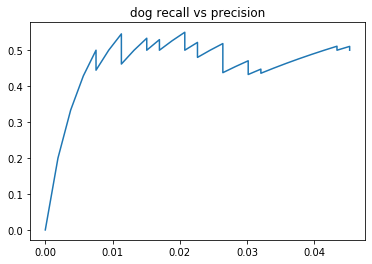

...

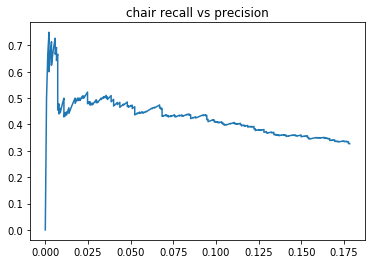

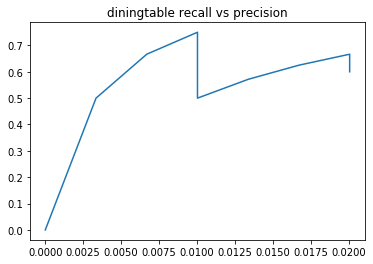

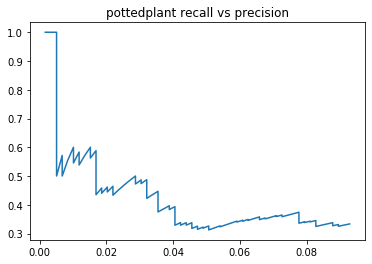

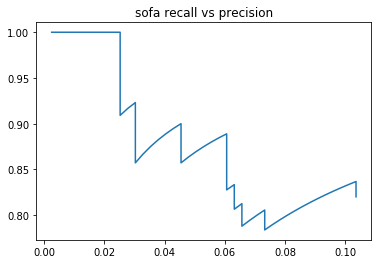

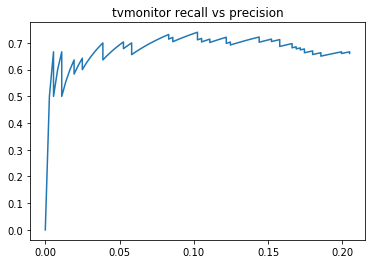

In [25]:
for key in log_dfs.keys():
    log_df=log_dfs[key]
    plt.plot(log_df.recall,log_df.precision)
    plt.title(key+' recall vs precision')
    plt.savefig(root+exp_name+'prec_recall.png')
    plt.show()

In [26]:
log_dfs['person'].tail(50)#.correct.sum()/total_true_per_class['person']#len(log_dfs['person'])

,class,iou,correct,True,img,boxx1,boxy1,boxx2,boxy2,conf,precision,recall,auc,new
2655,person,0.613906,1,1,897,0.4571,0.157722,0.809091,0.996109,0.38486,0.652485,0.331548,0.000131,0.000125
2656,person,0.686,1,1,2605,0.186212,0.219444,0.457816,0.949733,0.383572,0.652616,0.331739,0.000131,0.000125
2657,person,0.511161,1,1,2837,0.269603,0.0467748,0.44228,0.626102,0.383316,0.652746,0.331930,0.000131,0.000125
2658,person,0.636513,1,1,2955,0.438142,0.0193411,0.572363,0.667594,0.382119,0.652877,0.332122,0.000131,0.000125
2659,person,0.805514,1,1,3690,0.0211346,0.154525,0.485721,1.00351,0.381608,0.653008,0.332313,0.000130,0.000125
2660,person,0.687421,1,1,674,0.117654,0.225877,1.01216,0.959028,0.380881,0.653138,0.332504,0.000130,0.000125
2661,person,0.460905,0,1,2511,0.532468,0.010212,0.590014,0.115304,0.380688,0.652893,0.332504,-0.000245,0.000000
2662,person,0.603756,1,1,1107,0.0323229,0.215918,0.301531,1.09557,0.37966,0.653023,0.332696,0.000130,0.000125
2663,person,0.850304,1,1,4597,0.379947,-0.0279173,0.736371,1.02085,0.37787,0.653153,0.332887,0.000130,0.000125
2664,person,0.883533,1,1,1671,0.0290108,0.0135104,0.471538,1.01475,0.37611,0.653283,0.333078,0.000130,0.000125


In [27]:
#model.save(root+exp_name+'70.h5')

### Extra Debug

In [28]:
GRID_W=7
GRID_H=7
BATCH_SIZE=10
cell_x = tf.to_float(tf.reshape(tf.tile(tf.range(GRID_W), [GRID_H]), (1, GRID_H, GRID_W, 1, 1)))
cell_y = tf.transpose(cell_x, (0,2,1,3,4))
cell_grid = tf.tile(tf.concat([cell_x,cell_y], -1), [BATCH_SIZE, 1, 1, 5, 1])

#pred_xy = tf.sigmoid(y_pred[..., :2]) + cell_grid
#pred_wh = tf.exp(y_pred[..., 2:4]) * np.reshape(ANCHORS, [1,1,1,BOX,2])
sess=tf.Session()
x,y,grid=sess.run([cell_x,cell_y,cell_grid])

In [29]:
x.shape,y.shape,grid.shape

((1, 7, 7, 1, 1), (1, 7, 7, 1, 1), (10, 7, 7, 5, 2))

In [30]:
z=np.concatenate([x,y],-1)
z.shape

(1, 7, 7, 1, 2)

In [31]:
y_true=np.ones((7,7,10))
ob_mask= tf.expand_dims(y_true[..., 4], axis=-1)
sess=tf.Session()
_mask=sess.run(ob_mask)
_mask.shape,y_true[..., 4].shape

((7, 7, 1), (7, 7))

In [32]:
import numpy as np
import tensorflow as tf
label=np.ones((7,7,15))
label[...,14]=5
true_box=np.argmax(label[...,10:],-1)

In [33]:
wts=np.ones((10))
wts[3:7]=9
res=tf.gather(wts,true_box)
sess=tf.Session()
ret=sess.run(res)
ret

array([[9., 9., 9., 9., 9., 9., 9.],
       [9., 9., 9., 9., 9., 9., 9.],
       [9., 9., 9., 9., 9., 9., 9.],
       [9., 9., 9., 9., 9., 9., 9.],
       [9., 9., 9., 9., 9., 9., 9.],
       [9., 9., 9., 9., 9., 9., 9.],
       [9., 9., 9., 9., 9., 9., 9.]])

In [34]:
ret.shape,label[...,4:].shape,label[...,5:].shape

((7, 7), (7, 7, 11), (7, 7, 10))

In [35]:
import tensorflow as tf
X=tf.zeros((3,3))
Y=tf.equal(X,1)
A=tf.where(Y,X,tf.ones_like(X))
sess=tf.Session()
Z=sess.run(A)
Z 

array([[1., 1., 1.],
       [1., 1., 1.],
       [1., 1., 1.]], dtype=float32)

### Extra functions

In [36]:
import csv

def read_data(dataset):
  f=open(dataset+'/label.csv')
  file=csv.reader(f,delimiter=',')
  data=[]
  i=0
    
  sc=416.0
  for line in file:
      dt=line
      H=dt[0]
      W=dt[1]
      xmin=(float(dt[2]))/sc
      ymin=(float(dt[3]))/sc
      xmax=(float(dt[4]))/sc
      ymax=(float(dt[5]))/sc
    

      output={
          'filename':dataset+'/images/'+str(i)+'.jpg',
          'height':H,
          'width':W,
          'object':[{'name':'None',
          'xmin':xmin*IMAGE_W,
          'ymin':ymin*IMAGE_H,
          'xmax':xmax*IMAGE_W,
          'ymax':ymax*IMAGE_H}]
          }

      data.append(output)
      i=i+1
  return data
